<a href="https://colab.research.google.com/github/gnodking7/PINN-California-Delta/blob/main/gPINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preliminary Setup


## Install Packages

In [1]:
!pip install -q -U keras-tuner
!pip install deepxde

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.3/165.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 11.4 MB/s eta 0:00:00


In [2]:
!pip install tensorflow==2.10.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.1/578.1 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 73.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 36.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 37.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 27.6 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0

In [3]:
import keras_tuner
import numpy as np
import matplotlib.pylab as pl
import deepxde as dde
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import pickle

import sys
import os
import time

Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


No backend selected.
Finding available backend...
Found tensorflow.compat.v1
Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Enable just-in-time compilation with XLA.



## Read Data

### Read outflow and salinity data

In [4]:
### OPTIONAL, if mount manually by tab on left which is less work actually ###
# from google.colab import drive
# drive.mount('/content/drive',force_remount=True)

In [5]:
gdrive_root_path = os.path.join('/content/drive','My Drive','PINN')
sys.path.append(gdrive_root_path)

In [6]:
sys.path.append('/content/drive/My Drive/MAC/Python')

'''
The data is in an Excel file.
Daily DSM2 outflow and salinity at locations:
  Martinez, Port Chicago, Chipps Island, Pittsburg
from Apr 1 1990 to Dec 28 2017

Accessible at:

https://docs.google.com/spreadsheets/d/1qzX8yY7-jZG7cgqL_A_z7poU3b-P1lFF/edit?usp=sharing&ouid=113013518591133373461&rtpof=true&sd=true

'''
df = pd.read_excel("/content/drive/My Drive/MAC/Python/4locations.xlsx", header=None)
All = np.asarray(df)
All = All[7:, :]  # Discard headers

for i in range(len(All)):
    All[i, 1] = str(All[i, 1])  # Change dates to str

In [7]:
def data_pre(year, daily, window, window_len):
    """
    Returns preprocessed outflow data for a given 'year' at locations
    Martinez, Port Chicago, Chipps Island, Pittsburg such that
    to each day corresponds outflow data of length 'daily' + 'window'

    The preprocessed outflow data vector is created such that
    first 'daily' number of outflow (including current day) is included
    and prior 'window_len' many outflows are averaged 'window' many times

    PARAMETERS
    ----------
    year :        string or array of strings
                  Outflow year(s)
    daily :       int
                  number of outflow to include 'as-is'
    window :      int
                  number of average windows in return outflow
    window_len :  int
                  length of each window
    RETURNS
    -------
    M_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Martinez
    P_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Port Chicago
    C_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Chipps Island
    T_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Pittsburg
    """

    if type(year) == str:
        indices = np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), year)!=-1)
    else:
        indices = []
        for yr in year:
            indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
    total = daily + window * window_len
    OUT_d = All[indices[0] - (total - 1):indices[-1] + 1, 2:6] # Range of outflow to extract outflow vector from
    OUT_d = (OUT_d - np.min(OUT_d)) / (np.max(OUT_d) - np.min(OUT_d)) # Normalize

    ## Preprocessed outflow data for Martinez
    M_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 0]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 0])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        M_OUT.append(vec)
        cur += 1
    M_OUT = np.array(M_OUT)

    ## Preprocessed outflow data for Port Chicago
    P_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 1]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 1])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        P_OUT.append(vec)
        cur += 1
    P_OUT = np.array(P_OUT)

    ## Preprocessed outflow data for Chipps Island
    C_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 2]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 2])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        C_OUT.append(vec)
        cur += 1
    C_OUT = np.array(C_OUT)

    ## Preprocessed outflow data for Pittsburg
    T_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 3]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 3])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        T_OUT.append(vec)
        cur += 1
    T_OUT = np.array(T_OUT)

    return M_OUT, P_OUT, C_OUT, T_OUT

### Preprocess to create outflow vectors

In [8]:
# years = ['1991','1992','1993','1994','1995','1996','1997','1998','1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017']
years = ['1991','1992','1993','1994','1995','1996','1997','1998','1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015']

indices = []
for yr in years:
    indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
indices = np.array(indices)

EC_d = All[indices, 6:] # Salinity at three locations
EC_min = np.min(EC_d)
EC_max = np.max(EC_d)

'''
Create outflow data vectors at each location
To each day corresponds a 18-dim vector created from antecedent 118 outflow data:
  current day + previous 7 days + previous 110 days averaged into 10-dim values with window length 11
'''
M_OUT, P_OUT, C_OUT, T_OUT = data_pre(years, 8, 10, 11)

### Split data to 5-fold

In [9]:
def data_split(years, k):
    """
    Returns split EC data and inputs for ANN and PINN for each k-fold.

    PARAMETERS
    ----------
    years:     list of strings
               indicates data years
    k:         int
               k-fold number
    RETURNS
    -------
    DATA_SET:  length k Hash Table with integer 1,2,...,k as keys
               each item contains a Hash Table of the following data:

               tr_indices:    ndarray (_)
                              training indices
               tst_indices:   ndarray (_)
                              testing indices
               tr_EC_d:       ndarray (_, 3)
                              training EC at three locations
               tst_EC_d:      ndarray (_, 3)
                              testing EC at three locations
               Q:             ndarray (_, 18)
                              training outflow inputs for ANN
               Q_tst:         ndarray (_, 18)
                              testing outflow inputs for ANN
               X:             ndarray (_, 20)
                              training inputs for PINN
               X_tst:         ndarray (_, 20)
                              testing inputs for PINN
               Svals:         ndarray (_)
                              training EC array, corresponding to Q and X
               Svals_tst:     ndarray (_)
                              testing EC array, corresponding to Q_tst and X_tst
    """
    DATA_SET = dict()
    TST_YEARS = np.split(np.array(years), k)  # split years into k folds

    cur_fold = 1

    for tst_years in TST_YEARS:
        tr_years = np.setdiff1d(years, tst_years)
        tr_indices = []
        for yr in tr_years:
            tr_indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
        tr_indices = np.array(tr_indices)

        tst_indices = []
        for yr in tst_years:
            tst_indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
        tst_indices = np.array(tst_indices)

        ## Training data
        tr_EC_d = All[tr_indices, 6:]
        tr_EC_d = (tr_EC_d - EC_min) / (EC_max - EC_min) # Normalize

        Q = []  # Inputs for ANN
        X = []  # Inputs for PINN
        Svals = []  # Outputs (same for both ANN and PINN)

        portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

        for i in range(len(tr_EC_d)):
            cur_ind = tr_indices[i]
            for j in range(4):
                # Martinez
                if j == 0:
                    Q.append(M_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))
                elif j == 1:
                    continue    # Skip Port Chicago (not used for training)
                # Chipps Island
                elif j == 2:
                    Q.append(C_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([0.406, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))
                # Pittsburg
                elif j == 3:
                    Q.append(T_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([1, (cur_ind - 274) * portion], T_OUT[cur_ind-275, :])))
                Svals.append(tr_EC_d[i, j])

        Q = np.array(Q).astype('float32')
        X = np.array(X).astype('float32')
        Svals = np.array(Svals).astype('float32').flatten()[:, None]

        ## Testing data
        tst_EC_d = All[tst_indices, 6:]
        tst_EC_d = (tst_EC_d - EC_min) / (EC_max - EC_min) # Normalize

        Q_tst = []  # Validation inputs for ANN
        X_tst = []  # Validation inputs for PINN
        Svals_tst = []  # Validation outputs

        for i in range(len(tst_EC_d)):
            cur_ind = tst_indices[i]
            for j in range(4):
                # Martinez
                if j == 0:
                    Q_tst.append(M_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))
                elif j == 1:
                    continue
                # Chipps Island
                elif j == 2:
                    Q_tst.append(C_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([0.406, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))
                # Pittsburg
                elif j == 3:
                    Q_tst.append(T_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([1, (cur_ind - 274) * portion], T_OUT[cur_ind-275, :])))
                Svals_tst.append(tst_EC_d[i, j])

        Q_tst = np.array(Q_tst).astype('float32')
        X_tst = np.array(X_tst).astype('float32')
        Svals_tst = np.array(Svals_tst).astype('float32').flatten()[:, None]

        DATA_SET[cur_fold] = {'tr_indices':tr_indices, 'tst_indices':tst_indices, 'tr_EC_d':tr_EC_d, 'tst_EC_d':tst_EC_d,
                              'Q':Q, 'Q_tst':Q_tst, 'X':X, 'X_tst':X_tst, 'Svals':Svals, 'Svals_tst':Svals_tst}
        cur_fold += 1

    return DATA_SET

In [10]:
DATA_SET = data_split(years, 5)

## Define Evaluation Metrics

In [11]:
## Evaluation metrics
from collections import defaultdict
eval_metrics = ['MSE', 'Bias', 'R', 'RSR', 'NSE']

def evaluate_sequences(target, pred, metrics):
    assert len(target) == len(pred), 'Target and predicted sequence length must equal.'
    valid_entries = target>0
    sequence_length = np.sum(valid_entries)
    if np.any(sequence_length == 0):
        return {k: 0 for k in metrics}
    target=target[valid_entries]
    pred = pred[valid_entries]
    SD_pred = np.sqrt( np.sum((pred-np.mean(pred)) ** 2) /(sequence_length-1))
    SD_target = np.sqrt( np.sum((target-np.mean(target)) ** 2) /(sequence_length-1))

    eval_results = defaultdict(float)

    for m in metrics:
        if m =='MSE':
            eval_results[m] = ((target - pred)**2).mean()
        elif m =='Bias':
            eval_results[m] = np.sum(pred - target)/np.sum(target) * 100
        elif m == 'R':
            eval_results[m] = np.sum(np.abs((pred-np.mean(pred)) * (target - np.mean(target)))) / (sequence_length * SD_pred * SD_target)
        elif m == 'RSR':
            eval_results[m] = np.sqrt( np.sum( (target - pred) ** 2) / np.sum( (target - np.mean(target)) ** 2) )
        elif m == 'NSE':
            eval_results[m] = 1 - np.sum( ( target - pred ) ** 2 ) / np.sum( (target - np.mean(target) ) ** 2 )
    return eval_results

# 5-fold (Test: 1991-1995)



## Load Data

In [161]:
k = 1

Q = DATA_SET[k]['Q']
Q_tst = DATA_SET[k]['Q_tst']
X = DATA_SET[k]['X']
X_tst = DATA_SET[k]['X_tst']
Svals = DATA_SET[k]['Svals']
Svals_tst = DATA_SET[k]['Svals_tst']

In [162]:
'''
Create Port Chicago data for the current fold
'''

tr_indices = DATA_SET[k]['tr_indices']
tst_indices = DATA_SET[k]['tst_indices']

Svals_P = All[tr_indices, 7]
Svals_P = (Svals_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_P = np.array(Svals_P).astype('float32').flatten()[:, None]
Svals_tst_P = All[tst_indices, 7]
Svals_tst_P = (Svals_tst_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_tst_P = np.array(Svals_tst_P).astype('float32').flatten()[:, None]

Q_P = []  # Inputs for ANN (Port Chicago)
X_P = []  # Inputs for PINN (Port Chicago)

portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

for i in range(len(Svals_P)):
    cur_ind = tr_indices[i]
    Q_P.append(P_OUT[cur_ind-275, :])
    X_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_P = np.array(Q_P).astype('float32')
X_P = np.array(X_P).astype('float32')

Q_tst_P = []  # Inputs for ANN (Port Chicago)
X_tst_P = []  # Inputs for PINN (Port Chicago)

for i in range(len(Svals_tst_P)):
    cur_ind = tst_indices[i]
    Q_tst_P.append(P_OUT[cur_ind-275, :])
    X_tst_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_tst_P = np.array(Q_tst_P).astype('float32')
X_tst_P = np.array(X_tst_P).astype('float32')

## gPINN-0.00001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_000001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [167]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-5 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-5 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 8s 357us/sample - loss: 0.0476 - val_loss: 0.0682
Epoch 2/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0250 - val_loss: 0.0306
Epoch 3/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0159 - val_loss: 0.0214
Epoch 4/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0126 - val_loss: 0.0170
Epoch 5/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0110 - val_loss: 0.0182
Epoch 6/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0101 - val_loss: 0.0136
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0096 - val_loss: 0.0123
Epoch 8/5000
21915/21915 [==============================] - 1s 66us/sample - loss: 0.0091 - val_loss: 0.0117
Epoch 9/5000
21915/21915 [==============================] - 2s 75us/sample - l

In [168]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_000001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_000001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_000001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


gPINN results for training
------------------------------
MSE : 0.0041410825
Bias : -3.8818392902612686
R : 0.9785156482711732
RSR : 0.2398816
NSE : 0.9424568191170692


gPINN results for testing
------------------------------
MSE : 0.005972329
Bias : 7.363003492355347
R : 0.9709165084285585
RSR : 0.27144706
NSE : 0.926316499710083


In [169]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_000001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_000001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0042728093
Bias : -6.272222101688385
R : 0.9801013937197615
RSR : 0.24035957
NSE : 0.9422272741794586


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0061881733
Bias : 6.5324097871780396
R : 0.9760770541443682
RSR : 0.2698939
NSE : 0.9271572828292847


In [170]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_000001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 0.00001


## gPINN-0.0001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [163]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-4 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-4 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21888/21915 [============================>.] - ETA: 0s - loss: 0.0723

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21915/21915 [==============================] - 5s 217us/sample - loss: 0.0723 - val_loss: 0.0982
Epoch 2/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0294 - val_loss: 0.0500
Epoch 3/5000
21915/21915 [==============================] - 2s 68us/sample - loss: 0.0181 - val_loss: 0.0284
Epoch 4/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0137 - val_loss: 0.0204
Epoch 5/5000
21915/21915 [==============================] - 3s 134us/sample - loss: 0.0119 - val_loss: 0.0171
Epoch 6/5000
21915/21915 [==============================] - 2s 101us/sample - loss: 0.0108 - val_loss: 0.0148
Epoch 7/5000
21915/21915 [==============================] - 2s 75us/sample - loss: 0.0104 - val_loss: 0.0137
Epoch 8/5000
21915/21915 [==============================] - 1s 68us/sample - loss: 0.0098 - val_loss: 0.0134
Epoch 9/5000
21915/21915 [==============================] - 1s 65us/sample - loss: 0.0097 - val_loss: 0.0119
Epoch 10/5000
21915/21915 [==

In [164]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_00001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_00001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_00001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


gPINN results for training
------------------------------
MSE : 0.004048473
Bias : -3.3821076154708862
R : 0.9791804295076592
RSR : 0.23718412
NSE : 0.9437436908483505


gPINN results for testing
------------------------------
MSE : 0.006165906
Bias : 8.290485292673111
R : 0.9714430770498885
RSR : 0.27581108
NSE : 0.9239282459020615


In [165]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_00001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_00001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0038292005
Bias : -6.393521279096603
R : 0.982722802024958
RSR : 0.22754051
NSE : 0.9482253156602383


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.006215898
Bias : 7.026959955692291
R : 0.9780021940547424
RSR : 0.27049783
NSE : 0.9268309324979782


In [166]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_00001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 0.0001


## gPINN-0.001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [12]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_0001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [16]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.001 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.001 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 87us/sample - loss: 0.0408 - val_loss: 0.0616
Epoch 2/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0223 - val_loss: 0.0407
Epoch 3/5000
21915/21915 [==============================] - 1s 58us/sample - loss: 0.0168 - val_loss: 0.0291
Epoch 4/5000
21915/21915 [==============================] - 1s 62us/sample - loss: 0.0136 - val_loss: 0.0223
Epoch 5/5000
21915/21915 [==============================] - 1s 60us/sample - loss: 0.0117 - val_loss: 0.0178
Epoch 6/5000
21915/21915 [==============================] - 1s 59us/sample - loss: 0.0105 - val_loss: 0.0147
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0102 - val_loss: 0.0133
Epoch 8/5000
21915/21915 [==============================] - 1s 57us/sample - loss: 0.0099 - val_loss: 0.0126
Epoch 9/5000
21915/21915 [==============================] - 1s 57us/sample - lo

In [17]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_0001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_0001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_0001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0034159874
Bias : -3.836425021290779
R : 0.9819201069860078
RSR : 0.21787035
NSE : 0.9525325112044811


gPINN results for testing
------------------------------
MSE : 0.005471977
Bias : 6.376180797815323
R : 0.9731134907097682
RSR : 0.25982767
NSE : 0.9324895814061165


In [18]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_0001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_0001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0033779552
Bias : -5.019642040133476
R : 0.9826664211103373
RSR : 0.21371333
NSE : 0.9543266110122204


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.006163924
Bias : 7.513707131147385
R : 0.978712126658364
RSR : 0.26936457
NSE : 0.927442729473114


In [19]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_0001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 0.001


## gPINN-0.01

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [13]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [20]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.01 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.01 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 1s 67us/sample - loss: 0.0726 - val_loss: 0.1224
Epoch 2/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0315 - val_loss: 0.0560
Epoch 3/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0198 - val_loss: 0.0313
Epoch 4/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0144 - val_loss: 0.0225
Epoch 5/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0125 - val_loss: 0.0195
Epoch 6/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0115 - val_loss: 0.0164
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0104 - val_loss: 0.0137
Epoch 8/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0096 - val_loss: 0.0123
Epoch 9/5000
21915/21915 [==============================] - 1s 37us/sample - lo

In [21]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0032491367
Bias : -2.993585728108883
R : 0.9825657090125618
RSR : 0.2124829
NSE : 0.9548510164022446


gPINN results for testing
------------------------------
MSE : 0.0052359444
Bias : 4.691311344504356
R : 0.9729682762853444
RSR : 0.2541621
NSE : 0.935401625931263


In [22]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0034204016
Bias : -3.917405754327774
R : 0.981989603933874
RSR : 0.21505187
NSE : 0.9537526927888393


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0055407067
Bias : 4.859156161546707
R : 0.9786682557262504
RSR : 0.25538442
NSE : 0.9347787946462631


In [23]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 0.01


## gPINN-0.1

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [14]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_01 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [24]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.1 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.1 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 1s 66us/sample - loss: 0.0437 - val_loss: 0.0796
Epoch 2/5000
21915/21915 [==============================] - 1s 38us/sample - loss: 0.0240 - val_loss: 0.0366
Epoch 3/5000
21915/21915 [==============================] - 1s 36us/sample - loss: 0.0153 - val_loss: 0.0224
Epoch 4/5000
21915/21915 [==============================] - 1s 38us/sample - loss: 0.0122 - val_loss: 0.0167
Epoch 5/5000
21915/21915 [==============================] - 1s 36us/sample - loss: 0.0105 - val_loss: 0.0153
Epoch 6/5000
21915/21915 [==============================] - 1s 45us/sample - loss: 0.0099 - val_loss: 0.0137
Epoch 7/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0097 - val_loss: 0.0133
Epoch 8/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0093 - val_loss: 0.0118
Epoch 9/5000
21915/21915 [==============================] - 1s 50us/sample - lo

In [25]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_01 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_01.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_01.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0034741673
Bias : -2.220797911286354
R : 0.9809928965440557
RSR : 0.21971786
NSE : 0.9517240636050701


gPINN results for testing
------------------------------
MSE : 0.005922502
Bias : 5.322643369436264
R : 0.9700426890467738
RSR : 0.27031234
NSE : 0.9269312396645546


In [26]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_01.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_01.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.00380934
Bias : -3.072953410446644
R : 0.9803312839931476
RSR : 0.22694966
NSE : 0.9484938494861126


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.006483616
Bias : 4.424268007278442
R : 0.975484933993302
RSR : 0.27626157
NSE : 0.9236795455217361


In [27]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_01.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 0.1


## gPINN-1

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [15]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [28]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 69us/sample - loss: 0.0599 - val_loss: 0.1002
Epoch 2/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0313 - val_loss: 0.0482
Epoch 3/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0206 - val_loss: 0.0340
Epoch 4/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0147 - val_loss: 0.0227
Epoch 5/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0126 - val_loss: 0.0173
Epoch 6/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0114 - val_loss: 0.0175
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0104 - val_loss: 0.0141
Epoch 8/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0100 - val_loss: 0.0142
Epoch 9/5000
21915/21915 [==============================] - 1s 49us/sample - lo

In [29]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_1 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_1.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0033904682
Bias : -3.871365264058113
R : 0.9818554228180304
RSR : 0.21705502
NSE : 0.9528871178627014


gPINN results for testing
------------------------------
MSE : 0.0059697046
Bias : 5.580026283860207
R : 0.9704593207559662
RSR : 0.2713874
NSE : 0.9263488799333572


In [30]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_1.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_1.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.003542082
Bias : -4.357621818780899
R : 0.9817678187827417
RSR : 0.21884367
NSE : 0.9521074518561363


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.006157311
Bias : 3.809666261076927
R : 0.9759527326470465
RSR : 0.26922002
NSE : 0.9275205731391907


In [31]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 1


## gPINN-10

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 12

In [16]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_10 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [32]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 10 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 10 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='relu')(Inp)
L2 = keras.layers.Dense(12, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 73us/sample - loss: 0.0476 - val_loss: 0.0637
Epoch 2/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0263 - val_loss: 0.0461
Epoch 3/5000
21915/21915 [==============================] - 1s 36us/sample - loss: 0.0183 - val_loss: 0.0319
Epoch 4/5000
21915/21915 [==============================] - 1s 41us/sample - loss: 0.0148 - val_loss: 0.0220
Epoch 5/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0128 - val_loss: 0.0200
Epoch 6/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0119 - val_loss: 0.0172
Epoch 7/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0112 - val_loss: 0.0163
Epoch 8/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0108 - val_loss: 0.0149
Epoch 9/5000
21915/21915 [==============================] - 1s 54us/sample - lo

In [33]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model1_10 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model1_10.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model1_10.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0040367255
Bias : -0.46464866027235985
R : 0.9763591403988416
RSR : 0.23683976
NSE : 0.9439069330692291


gPINN results for testing
------------------------------
MSE : 0.0074245417
Bias : 4.340279474854469
R : 0.9631387489554349
RSR : 0.30265516
NSE : 0.9083998575806618


In [34]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model1_10.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model1_10.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0045181722
Bias : -1.0213076137006283
R : 0.975803032708545
RSR : 0.24716449
NSE : 0.9389097169041634


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.008405602
Bias : 2.175632305443287
R : 0.9685882067653826
RSR : 0.31455475
NSE : 0.9010553061962128


In [35]:
## Save model
model_path_prefix = "gPINN_5fold_1 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model1_10.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_1 (M+C+T) - 10


# 5-fold (Test: 1996-2000)



## Load Data

In [171]:
k = 2

Q = DATA_SET[k]['Q']
Q_tst = DATA_SET[k]['Q_tst']
X = DATA_SET[k]['X']
X_tst = DATA_SET[k]['X_tst']
Svals = DATA_SET[k]['Svals']
Svals_tst = DATA_SET[k]['Svals_tst']

In [172]:
'''
Create Port Chicago data for the current fold
'''

tr_indices = DATA_SET[k]['tr_indices']
tst_indices = DATA_SET[k]['tst_indices']

Svals_P = All[tr_indices, 7]
Svals_P = (Svals_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_P = np.array(Svals_P).astype('float32').flatten()[:, None]
Svals_tst_P = All[tst_indices, 7]
Svals_tst_P = (Svals_tst_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_tst_P = np.array(Svals_tst_P).astype('float32').flatten()[:, None]

Q_P = []  # Inputs for ANN (Port Chicago)
X_P = []  # Inputs for PINN (Port Chicago)

portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

for i in range(len(Svals_P)):
    cur_ind = tr_indices[i]
    Q_P.append(P_OUT[cur_ind-275, :])
    X_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_P = np.array(Q_P).astype('float32')
X_P = np.array(X_P).astype('float32')

Q_tst_P = []  # Inputs for ANN (Port Chicago)
X_tst_P = []  # Inputs for PINN (Port Chicago)

for i in range(len(Svals_tst_P)):
    cur_ind = tst_indices[i]
    Q_tst_P.append(P_OUT[cur_ind-275, :])
    X_tst_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_tst_P = np.array(Q_tst_P).astype('float32')
X_tst_P = np.array(X_tst_P).astype('float32')

## gPINN-0.00001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_000001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [177]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-5 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-5 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
20864/21912 [===========================>..] - ETA: 0s - loss: 0.0689

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21912/21912 [==============================] - 4s 164us/sample - loss: 0.0672 - val_loss: 0.0283
Epoch 2/5000
21912/21912 [==============================] - 1s 53us/sample - loss: 0.0289 - val_loss: 0.0161
Epoch 3/5000
21912/21912 [==============================] - 1s 52us/sample - loss: 0.0193 - val_loss: 0.0103
Epoch 4/5000
21912/21912 [==============================] - 1s 53us/sample - loss: 0.0145 - val_loss: 0.0077
Epoch 5/5000
21912/21912 [==============================] - 1s 58us/sample - loss: 0.0117 - val_loss: 0.0081
Epoch 6/5000
21912/21912 [==============================] - 1s 57us/sample - loss: 0.0110 - val_loss: 0.0070
Epoch 7/5000
21912/21912 [==============================] - 1s 45us/sample - loss: 0.0110 - val_loss: 0.0067
Epoch 8/5000
21912/21912 [==============================] - 1s 39us/sample - loss: 0.0102 - val_loss: 0.0060
Epoch 9/5000
21912/21912 [==============================] - 1s 39us/sample - loss: 0.0099 - val_loss: 0.0059
Epoch 10/5000
21912/21912 [====

In [178]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_000001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_000001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_000001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0035418142
Bias : 4.623372480273247
R : 0.9807659336593667
RSR : 0.21773808
NSE : 0.9525901302695274


gPINN results for testing
------------------------------
MSE : 0.0025332805
Bias : -3.398314490914345
R : 0.981938117935843
RSR : 0.21655352
NSE : 0.9531045705080032


In [179]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_000001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_000001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0036084414
Bias : 4.010982811450958
R : 0.9808090117055625
RSR : 0.21945289
NSE : 0.9518404304981232


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0024851155
Bias : -3.788651153445244
R : 0.9839724201628055
RSR : 0.20490889
NSE : 0.9580123461782932


In [180]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_000001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 0.00001


## gPINN-0.0001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [173]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-4 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-4 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - ETA: 0s - loss: 0.0636

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21912/21912 [==============================] - 3s 141us/sample - loss: 0.0636 - val_loss: 0.0321
Epoch 2/5000
21912/21912 [==============================] - 1s 46us/sample - loss: 0.0303 - val_loss: 0.0184
Epoch 3/5000
21912/21912 [==============================] - 1s 54us/sample - loss: 0.0213 - val_loss: 0.0111
Epoch 4/5000
21912/21912 [==============================] - 1s 52us/sample - loss: 0.0156 - val_loss: 0.0088
Epoch 5/5000
21912/21912 [==============================] - 1s 55us/sample - loss: 0.0128 - val_loss: 0.0085
Epoch 6/5000
21912/21912 [==============================] - 1s 55us/sample - loss: 0.0118 - val_loss: 0.0078
Epoch 7/5000
21912/21912 [==============================] - 1s 55us/sample - loss: 0.0106 - val_loss: 0.0063
Epoch 8/5000
21912/21912 [==============================] - 1s 47us/sample - loss: 0.0103 - val_loss: 0.0073
Epoch 9/5000
21912/21912 [==============================] - 1s 51us/sample - loss: 0.0101 - val_loss: 0.0060
Epoch 10/5000
21912/21912 [====

In [174]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_00001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_00001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_00001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


gPINN results for training
------------------------------
MSE : 0.0036842795
Bias : 3.3919449895620346
R : 0.9798098237447003
RSR : 0.22207405
NSE : 0.9506831206381321


gPINN results for testing
------------------------------
MSE : 0.0028966567
Bias : -4.542231559753418
R : 0.9803177270660243
RSR : 0.2315646
NSE : 0.9463778398931026


In [175]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_00001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_00001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0035002304
Bias : 2.0017746835947037
R : 0.9803158508833233
RSR : 0.21613733
NSE : 0.9532846547663212


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.00281114
Bias : -5.901522189378738
R : 0.9838257700443247
RSR : 0.21793588
NSE : 0.9525039531290531


In [176]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_00001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 0.0001


## gPINN-0.001

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [17]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_0001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [38]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.001 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.001 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 2s 110us/sample - loss: 0.0843 - val_loss: 0.0279
Epoch 2/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0314 - val_loss: 0.0140
Epoch 3/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0198 - val_loss: 0.0094
Epoch 4/5000
21912/21912 [==============================] - 1s 38us/sample - loss: 0.0150 - val_loss: 0.0079
Epoch 5/5000
21912/21912 [==============================] - 1s 38us/sample - loss: 0.0132 - val_loss: 0.0076
Epoch 6/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0115 - val_loss: 0.0071
Epoch 7/5000
21912/21912 [==============================] - 1s 36us/sample - loss: 0.0109 - val_loss: 0.0066
Epoch 8/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0105 - val_loss: 0.0070
Epoch 9/5000
21912/21912 [==============================] - 1s 37us/sample - l

In [39]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_0001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_0001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_0001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0038680674
Bias : 4.586450755596161
R : 0.9790200520627224
RSR : 0.22754563
NSE : 0.9482229836285114


gPINN results for testing
------------------------------
MSE : 0.002654457
Bias : -2.3651832714676857
R : 0.9788161962435963
RSR : 0.22167233
NSE : 0.9508613795042038


In [40]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_0001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_0001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0037462898
Bias : 3.5514727234840393
R : 0.9797909173327609
RSR : 0.22360532
NSE : 0.9500006586313248


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0022394669
Bias : -3.9259951561689377
R : 0.9837072525436255
RSR : 0.19451801
NSE : 0.9621627405285835


In [41]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_0001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 0.001


## gPINN-0.01

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [18]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [42]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.01 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.01 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 3s 129us/sample - loss: 0.0823 - val_loss: 0.0357
Epoch 2/5000
21912/21912 [==============================] - 1s 46us/sample - loss: 0.0326 - val_loss: 0.0216
Epoch 3/5000
21912/21912 [==============================] - 1s 42us/sample - loss: 0.0267 - val_loss: 0.0153
Epoch 4/5000
21912/21912 [==============================] - 1s 40us/sample - loss: 0.0218 - val_loss: 0.0107
Epoch 5/5000
21912/21912 [==============================] - 1s 40us/sample - loss: 0.0177 - val_loss: 0.0088
Epoch 6/5000
21912/21912 [==============================] - 1s 39us/sample - loss: 0.0150 - val_loss: 0.0078
Epoch 7/5000
21912/21912 [==============================] - 1s 38us/sample - loss: 0.0134 - val_loss: 0.0074
Epoch 8/5000
21912/21912 [==============================] - 1s 50us/sample - loss: 0.0122 - val_loss: 0.0072
Epoch 9/5000
21912/21912 [==============================] - 1s 52us/sample - l

In [43]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0041953805
Bias : 5.453040823340416
R : 0.9779936046127309
RSR : 0.23697753
NSE : 0.9438416510820389


gPINN results for testing
------------------------------
MSE : 0.002734579
Bias : 1.857815682888031
R : 0.9783735460230512
RSR : 0.22499292
NSE : 0.9493781849741936


In [44]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0041322205
Bias : 3.827271983027458
R : 0.9786760599659696
RSR : 0.23484062
NSE : 0.9448498822748661


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0024197262
Bias : -0.35973063204437494
R : 0.9822766336591799
RSR : 0.2021951
NSE : 0.9591171443462372


In [45]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 0.01


## gPINN-0.1

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [19]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_01 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [46]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.1 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.1 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 2s 91us/sample - loss: 0.0685 - val_loss: 0.0263
Epoch 2/5000
21912/21912 [==============================] - 1s 39us/sample - loss: 0.0280 - val_loss: 0.0151
Epoch 3/5000
21912/21912 [==============================] - 1s 38us/sample - loss: 0.0185 - val_loss: 0.0094
Epoch 4/5000
21912/21912 [==============================] - 1s 42us/sample - loss: 0.0142 - val_loss: 0.0075
Epoch 5/5000
21912/21912 [==============================] - 1s 50us/sample - loss: 0.0126 - val_loss: 0.0075
Epoch 6/5000
21912/21912 [==============================] - 1s 52us/sample - loss: 0.0119 - val_loss: 0.0071
Epoch 7/5000
21912/21912 [==============================] - 1s 54us/sample - loss: 0.0113 - val_loss: 0.0062
Epoch 8/5000
21912/21912 [==============================] - 1s 55us/sample - loss: 0.0107 - val_loss: 0.0061
Epoch 9/5000
21912/21912 [==============================] - 1s 55us/sample - lo

In [47]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_01 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_01.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_01.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0037314745
Bias : 1.4281336218118668
R : 0.979557643426603
RSR : 0.22349188
NSE : 0.9500513821840286


gPINN results for testing
------------------------------
MSE : 0.002956188
Bias : -4.254282638430595
R : 0.9790359628036387
RSR : 0.23393202
NSE : 0.9452758133411407


In [48]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_01.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_01.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0035850652
Bias : -0.32890739385038614
R : 0.9804147587462786
RSR : 0.2187409
NSE : 0.9521524198353291


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0027928806
Bias : -6.575454026460648
R : 0.9837316890528313
RSR : 0.21722694
NSE : 0.9528124555945396


In [49]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_01.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 0.1


## gPINN-1

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [20]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [50]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 2s 93us/sample - loss: 0.0849 - val_loss: 0.0285
Epoch 2/5000
21912/21912 [==============================] - 1s 39us/sample - loss: 0.0319 - val_loss: 0.0144
Epoch 3/5000
21912/21912 [==============================] - 1s 38us/sample - loss: 0.0212 - val_loss: 0.0096
Epoch 4/5000
21912/21912 [==============================] - 1s 51us/sample - loss: 0.0159 - val_loss: 0.0081
Epoch 5/5000
21912/21912 [==============================] - 1s 49us/sample - loss: 0.0141 - val_loss: 0.0081
Epoch 6/5000
21912/21912 [==============================] - 1s 52us/sample - loss: 0.0122 - val_loss: 0.0078
Epoch 7/5000
21912/21912 [==============================] - 1s 52us/sample - loss: 0.0116 - val_loss: 0.0063
Epoch 8/5000
21912/21912 [==============================] - 1s 54us/sample - loss: 0.0112 - val_loss: 0.0060
Epoch 9/5000
21912/21912 [==============================] - 1s 54us/sample - lo

In [51]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_1 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_1.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0045615076
Bias : 2.1388698369264603
R : 0.9744536478991681
RSR : 0.2471017
NSE : 0.9389407560229301


gPINN results for testing
------------------------------
MSE : 0.0029276607
Bias : -4.046211391687393
R : 0.9766712784120771
RSR : 0.23280056
NSE : 0.9458039030432701


In [52]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_1.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_1.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0044687893
Bias : 0.22003869526088238
R : 0.9755713500226086
RSR : 0.24421729
NSE : 0.9403579160571098


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0023831988
Bias : -5.516215041279793
R : 0.9842217742518874
RSR : 0.20066315
NSE : 0.9597342982888222


In [53]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 1


## gPINN-10

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [21]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_10 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [54]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 10 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 10 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='relu')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 3s 149us/sample - loss: 0.0630 - val_loss: 0.0274
Epoch 2/5000
21912/21912 [==============================] - 1s 53us/sample - loss: 0.0271 - val_loss: 0.0133
Epoch 3/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0176 - val_loss: 0.0096
Epoch 4/5000
21912/21912 [==============================] - 1s 36us/sample - loss: 0.0140 - val_loss: 0.0073
Epoch 5/5000
21912/21912 [==============================] - 1s 36us/sample - loss: 0.0127 - val_loss: 0.0069
Epoch 6/5000
21912/21912 [==============================] - 1s 37us/sample - loss: 0.0116 - val_loss: 0.0080
Epoch 7/5000
21912/21912 [==============================] - 1s 36us/sample - loss: 0.0115 - val_loss: 0.0070
Epoch 8/5000
21912/21912 [==============================] - 1s 36us/sample - loss: 0.0110 - val_loss: 0.0064
Epoch 9/5000
21912/21912 [==============================] - 1s 37us/sample - l

In [55]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model2_10 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model2_10.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model2_10.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.004049347
Bias : 4.093256965279579
R : 0.9789846920513013
RSR : 0.23281662
NSE : 0.9457964226603508


gPINN results for testing
------------------------------
MSE : 0.0032677185
Bias : -4.4548723846673965
R : 0.976819156382759
RSR : 0.24594949
NSE : 0.9395088441669941


In [56]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model2_10.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model2_10.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0031676893
Bias : 1.930667832493782
R : 0.9819665095178208
RSR : 0.20561403
NSE : 0.957722868770361


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0025179978
Bias : -6.516297161579132
R : 0.9845273744192505
RSR : 0.20626007
NSE : 0.9574567824602127


In [57]:
## Save model
model_path_prefix = "gPINN_5fold_2 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model2_10.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_2 (M+C+T) - 10


# 5-fold (Test: 2001-2005)



## Load Data

In [181]:
k = 3

Q = DATA_SET[k]['Q']
Q_tst = DATA_SET[k]['Q_tst']
X = DATA_SET[k]['X']
X_tst = DATA_SET[k]['X_tst']
Svals = DATA_SET[k]['Svals']
Svals_tst = DATA_SET[k]['Svals_tst']

In [182]:
'''
Create Port Chicago data for the current fold
'''

tr_indices = DATA_SET[k]['tr_indices']
tst_indices = DATA_SET[k]['tst_indices']

Svals_P = All[tr_indices, 7]
Svals_P = (Svals_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_P = np.array(Svals_P).astype('float32').flatten()[:, None]
Svals_tst_P = All[tst_indices, 7]
Svals_tst_P = (Svals_tst_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_tst_P = np.array(Svals_tst_P).astype('float32').flatten()[:, None]

Q_P = []  # Inputs for ANN (Port Chicago)
X_P = []  # Inputs for PINN (Port Chicago)

portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

for i in range(len(Svals_P)):
    cur_ind = tr_indices[i]
    Q_P.append(P_OUT[cur_ind-275, :])
    X_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_P = np.array(Q_P).astype('float32')
X_P = np.array(X_P).astype('float32')

Q_tst_P = []  # Inputs for ANN (Port Chicago)
X_tst_P = []  # Inputs for PINN (Port Chicago)

for i in range(len(Svals_tst_P)):
    cur_ind = tst_indices[i]
    Q_tst_P.append(P_OUT[cur_ind-275, :])
    X_tst_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_tst_P = np.array(Q_tst_P).astype('float32')
X_tst_P = np.array(X_tst_P).astype('float32')

## gPINN-0.00001

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_000001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [183]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-5 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-5 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 5s 216us/sample - loss: 0.0461 - val_loss: 0.0340
Epoch 2/5000
21915/21915 [==============================] - 2s 76us/sample - loss: 0.0318 - val_loss: 0.0283
Epoch 3/5000
21915/21915 [==============================] - 2s 86us/sample - loss: 0.0234 - val_loss: 0.0203
Epoch 4/5000
21915/21915 [==============================] - 2s 76us/sample - loss: 0.0179 - val_loss: 0.0150
Epoch 5/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0154 - val_loss: 0.0126
Epoch 6/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0143 - val_loss: 0.0121
Epoch 7/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0129 - val_loss: 0.0106
Epoch 8/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0126 - val_loss: 0.0100
Epoch 9/5000
21915/21915 [==============================] - 1s 51us/sample - l

In [184]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_000001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_000001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_000001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0040044105
Bias : 0.22508744150400162
R : 0.9781708328324743
RSR : 0.22823462
NSE : 0.9479089565575123


gPINN results for testing
------------------------------
MSE : 0.0040770834
Bias : -1.0725112631917
R : 0.973166003576182
RSR : 0.2559146
NSE : 0.9345077201724052


In [185]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_000001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_000001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.004304207
Bias : -0.8757418021559715
R : 0.9783331340248819
RSR : 0.23194368
NSE : 0.9462021254003048


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0045242063
Bias : -2.086217515170574
R : 0.9674152041912107
RSR : 0.27137914
NSE : 0.9263533651828766


In [186]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_000001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 0.00001


## gPINN-0.0001

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [187]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-4 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-4 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 6s 273us/sample - loss: 0.0593 - val_loss: 0.0381
Epoch 2/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0361 - val_loss: 0.0328
Epoch 3/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0269 - val_loss: 0.0250
Epoch 4/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0201 - val_loss: 0.0170
Epoch 5/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0165 - val_loss: 0.0142
Epoch 6/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0148 - val_loss: 0.0121
Epoch 7/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0135 - val_loss: 0.0111
Epoch 8/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0125 - val_loss: 0.0109
Epoch 9/5000
21915/21915 [==============================] - 1s 64us/sample - l

In [188]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_00001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_00001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_00001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


gPINN results for training
------------------------------
MSE : 0.002162296
Bias : -0.8605316281318665
R : 0.9874070181006013
RSR : 0.1677142
NSE : 0.9718719515949488


gPINN results for testing
------------------------------
MSE : 0.00244318
Bias : -0.18059046706184745
R : 0.9825341572547442
RSR : 0.19810617
NSE : 0.9607539474964142


In [189]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_00001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_00001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0041848714
Bias : -7.819975167512894
R : 0.9856146931296303
RSR : 0.22870573
NSE : 0.9476936869323254


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.004192046
Bias : -7.180207222700119
R : 0.9756265590297976
RSR : 0.26122713
NSE : 0.9317603930830956


In [190]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_00001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 0.0001


## gPINN-0.001

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [22]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_0001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [60]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.001 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.001 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 139us/sample - loss: 0.0594 - val_loss: 0.0393
Epoch 2/5000
21915/21915 [==============================] - 2s 75us/sample - loss: 0.0364 - val_loss: 0.0332
Epoch 3/5000
21915/21915 [==============================] - 2s 77us/sample - loss: 0.0333 - val_loss: 0.0329
Epoch 4/5000
21915/21915 [==============================] - 2s 80us/sample - loss: 0.0295 - val_loss: 0.0291
Epoch 5/5000
21915/21915 [==============================] - 1s 67us/sample - loss: 0.0251 - val_loss: 0.0233
Epoch 6/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0209 - val_loss: 0.0192
Epoch 7/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0179 - val_loss: 0.0151
Epoch 8/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0160 - val_loss: 0.0142
Epoch 9/5000
21915/21915 [==============================] - 1s 52us/sample - l

In [61]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_0001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_0001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_0001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0023558533
Bias : -0.5195619072765112
R : 0.9863503736562913
RSR : 0.17505977
NSE : 0.9693540781736374


gPINN results for testing
------------------------------
MSE : 0.0026599767
Bias : -0.5304889287799597
R : 0.9806213168530874
RSR : 0.2067089
NSE : 0.9572714306414127


In [62]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_0001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_0001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0039575575
Bias : -7.586296647787094
R : 0.9850461337950002
RSR : 0.2224076
NSE : 0.9505348615348339


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0041812956
Bias : -7.924818247556686
R : 0.9759273442519159
RSR : 0.26089194
NSE : 0.9319353923201561


In [63]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_0001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 0.001


## gPINN-0.01

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [23]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [64]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.01 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.01 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 133us/sample - loss: 0.0504 - val_loss: 0.0362
Epoch 2/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0328 - val_loss: 0.0293
Epoch 3/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0258 - val_loss: 0.0225
Epoch 4/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0203 - val_loss: 0.0172
Epoch 5/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0166 - val_loss: 0.0148
Epoch 6/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0148 - val_loss: 0.0123
Epoch 7/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0135 - val_loss: 0.0116
Epoch 8/5000
21915/21915 [==============================] - 2s 81us/sample - loss: 0.0128 - val_loss: 0.0105
Epoch 9/5000
21915/21915 [==============================] - 2s 82us/sample - l

In [65]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0037084522
Bias : 0.10535462060943246
R : 0.9805111125487295
RSR : 0.21963856
NSE : 0.9517589062452316


gPINN results for testing
------------------------------
MSE : 0.003638771
Bias : -0.6674788426607847
R : 0.9758706902184643
RSR : 0.24176733
NSE : 0.9415485560894012


In [66]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0036005366
Bias : -1.4777682721614838
R : 0.9821878353433311
RSR : 0.21213855
NSE : 0.9549972340464592


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.003758243
Bias : -2.104535885155201
R : 0.972629165685917
RSR : 0.24734189
NSE : 0.9388219900429249


In [67]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 0.01


## gPINN-0.1

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [24]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_01 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [68]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.1 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.1 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 156us/sample - loss: 0.0502 - val_loss: 0.0349
Epoch 2/5000
21915/21915 [==============================] - 2s 77us/sample - loss: 0.0315 - val_loss: 0.0280
Epoch 3/5000
21915/21915 [==============================] - 2s 81us/sample - loss: 0.0245 - val_loss: 0.0222
Epoch 4/5000
21915/21915 [==============================] - 2s 83us/sample - loss: 0.0191 - val_loss: 0.0159
Epoch 5/5000
21915/21915 [==============================] - 1s 66us/sample - loss: 0.0159 - val_loss: 0.0132
Epoch 6/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0140 - val_loss: 0.0120
Epoch 7/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0133 - val_loss: 0.0112
Epoch 8/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0125 - val_loss: 0.0105
Epoch 9/5000
21915/21915 [==============================] - 1s 51us/sample - l

In [69]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_01 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_01.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_01.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.004117285
Bias : 1.649477332830429
R : 0.9782240736500416
RSR : 0.23142895
NSE : 0.9464406408369541


gPINN results for testing
------------------------------
MSE : 0.0040484625
Bias : 1.3395510613918304
R : 0.9734144023707446
RSR : 0.25501478
NSE : 0.934967465698719


In [70]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_01.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_01.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.003880471
Bias : -0.3017784561961889
R : 0.9803986313766572
RSR : 0.22023088
NSE : 0.9514983594417572


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0039818883
Bias : -0.6223843432962894
R : 0.9709752281817484
RSR : 0.25459495
NSE : 0.9351814091205597


In [71]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_01.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 0.1


## gPINN-1

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [25]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [72]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 4s 187us/sample - loss: 0.0595 - val_loss: 0.0403
Epoch 2/5000
21915/21915 [==============================] - 2s 77us/sample - loss: 0.0369 - val_loss: 0.0356
Epoch 3/5000
21915/21915 [==============================] - 2s 81us/sample - loss: 0.0310 - val_loss: 0.0283
Epoch 4/5000
21915/21915 [==============================] - 2s 69us/sample - loss: 0.0252 - val_loss: 0.0252
Epoch 5/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0204 - val_loss: 0.0178
Epoch 6/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0170 - val_loss: 0.0149
Epoch 7/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0157 - val_loss: 0.0129
Epoch 8/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0142 - val_loss: 0.0120
Epoch 9/5000
21915/21915 [==============================] - 1s 52us/sample - l

In [73]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_1 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_1.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0038877402
Bias : -0.33590414095669985
R : 0.9799497894900264
RSR : 0.22488518
NSE : 0.9494266547262669


gPINN results for testing
------------------------------
MSE : 0.0037183338
Bias : -1.2102744542062283
R : 0.9771901637337196
RSR : 0.2443962
NSE : 0.9402704983949661


In [74]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_1.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_1.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0037679377
Bias : -1.5324108302593231
R : 0.981285068647937
RSR : 0.21701404
NSE : 0.9529049023985863


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0037062557
Bias : -2.3621968924999237
R : 0.9749496420145431
RSR : 0.24562521
NSE : 0.9396682567894459


In [75]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 1


## gPINN-10

Hyperparameters:
*   activation_1: elu
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 12

In [26]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_10 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [76]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 10 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 10 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(24, activation='elu')(Inp)
L2 = keras.layers.Dense(12, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 152us/sample - loss: 0.0678 - val_loss: 0.0424
Epoch 2/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0398 - val_loss: 0.0374
Epoch 3/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0352 - val_loss: 0.0324
Epoch 4/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0296 - val_loss: 0.0286
Epoch 5/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0235 - val_loss: 0.0210
Epoch 6/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0189 - val_loss: 0.0169
Epoch 7/5000
21915/21915 [==============================] - 2s 73us/sample - loss: 0.0168 - val_loss: 0.0138
Epoch 8/5000
21915/21915 [==============================] - 2s 74us/sample - loss: 0.0152 - val_loss: 0.0132
Epoch 9/5000
21915/21915 [==============================] - 2s 78us/sample - l

In [77]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model3_10 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model3_10.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model3_10.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.004187677
Bias : 0.6706712301820517
R : 0.9791914544483279
RSR : 0.23339891
NSE : 0.945524949580431


gPINN results for testing
------------------------------
MSE : 0.0042506633
Bias : -1.021138671785593
R : 0.9741256795166126
RSR : 0.26130554
NSE : 0.9317194148898125


In [78]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model3_10.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model3_10.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.003397554
Bias : -1.5996003523468971
R : 0.9833930575142653
RSR : 0.20607209
NSE : 0.9575342945754528


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0036759607
Bias : -2.688292972743511
R : 0.974228383938185
RSR : 0.24461928
NSE : 0.9401614107191563


In [79]:
## Save model
model_path_prefix = "gPINN_5fold_3 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model3_10.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_3 (M+C+T) - 10


# 5-fold (Test: 2006-2010)



## Load Data

In [191]:
k = 4

Q = DATA_SET[k]['Q']
Q_tst = DATA_SET[k]['Q_tst']
X = DATA_SET[k]['X']
X_tst = DATA_SET[k]['X_tst']
Svals = DATA_SET[k]['Svals']
Svals_tst = DATA_SET[k]['Svals_tst']

In [192]:
'''
Create Port Chicago data for the current fold
'''

tr_indices = DATA_SET[k]['tr_indices']
tst_indices = DATA_SET[k]['tst_indices']

Svals_P = All[tr_indices, 7]
Svals_P = (Svals_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_P = np.array(Svals_P).astype('float32').flatten()[:, None]
Svals_tst_P = All[tst_indices, 7]
Svals_tst_P = (Svals_tst_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_tst_P = np.array(Svals_tst_P).astype('float32').flatten()[:, None]

Q_P = []  # Inputs for ANN (Port Chicago)
X_P = []  # Inputs for PINN (Port Chicago)

portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

for i in range(len(Svals_P)):
    cur_ind = tr_indices[i]
    Q_P.append(P_OUT[cur_ind-275, :])
    X_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_P = np.array(Q_P).astype('float32')
X_P = np.array(X_P).astype('float32')

Q_tst_P = []  # Inputs for ANN (Port Chicago)
X_tst_P = []  # Inputs for PINN (Port Chicago)

for i in range(len(Svals_tst_P)):
    cur_ind = tst_indices[i]
    Q_tst_P.append(P_OUT[cur_ind-275, :])
    X_tst_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_tst_P = np.array(Q_tst_P).astype('float32')
X_tst_P = np.array(X_tst_P).astype('float32')

## gPINN-0.00001

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_000001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [193]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-5 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-5 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21632/21915 [============================>.] - ETA: 0s - loss: 0.0568

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21915/21915 [==============================] - 4s 198us/sample - loss: 0.0566 - val_loss: 0.0383
Epoch 2/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0300 - val_loss: 0.0249
Epoch 3/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0181 - val_loss: 0.0189
Epoch 4/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0143 - val_loss: 0.0154
Epoch 5/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0128 - val_loss: 0.0139
Epoch 6/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0120 - val_loss: 0.0139
Epoch 7/5000
21915/21915 [==============================] - 1s 60us/sample - loss: 0.0113 - val_loss: 0.0130
Epoch 8/5000
21915/21915 [==============================] - 2s 73us/sample - loss: 0.0110 - val_loss: 0.0123
Epoch 9/5000
21915/21915 [==============================] - 2s 75us/sample - loss: 0.0108 - val_loss: 0.0118
Epoch 10/5000
21915/21915 [====

In [194]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_000001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_000001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_000001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0021293561
Bias : -0.5940814036875963
R : 0.9871519562933964
RSR : 0.16849151
NSE : 0.9716106094419956


gPINN results for testing
------------------------------
MSE : 0.002170415
Bias : 0.19863040652126074
R : 0.9854480854704506
RSR : 0.17639372
NSE : 0.9688852578401566


In [195]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_000001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_000001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0026029018
Bias : 1.2710980139672756
R : 0.9860155829044202
RSR : 0.18269074
NSE : 0.966624092310667


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0029053788
Bias : 2.782665193080902
R : 0.9806808354238081
RSR : 0.20508014
NSE : 0.9579421356320381


In [196]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_000001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 0.00001


## gPINN-0.0001

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [197]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-4 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-4 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 4s 194us/sample - loss: 0.0485 - val_loss: 0.0384
Epoch 2/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0300 - val_loss: 0.0277
Epoch 3/5000
21915/21915 [==============================] - 2s 69us/sample - loss: 0.0196 - val_loss: 0.0202
Epoch 4/5000
21915/21915 [==============================] - 2s 72us/sample - loss: 0.0155 - val_loss: 0.0170
Epoch 5/5000
21915/21915 [==============================] - 2s 78us/sample - loss: 0.0135 - val_loss: 0.0152
Epoch 6/5000
21915/21915 [==============================] - 2s 78us/sample - loss: 0.0127 - val_loss: 0.0132
Epoch 7/5000
21915/21915 [==============================] - 1s 57us/sample - loss: 0.0119 - val_loss: 0.0128
Epoch 8/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0114 - val_loss: 0.0114
Epoch 9/5000
21915/21915 [==============================] - 1s 50us/sample - l

In [198]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_00001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_00001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_00001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0023432937
Bias : -3.945961222052574
R : 0.9870823498970835
RSR : 0.1767532
NSE : 0.9687583111226559


gPINN results for testing
------------------------------
MSE : 0.0023471296
Bias : -1.093568280339241
R : 0.9844923671235906
RSR : 0.18343419
NSE : 0.9663519002497196


In [199]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_00001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_00001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.004343643
Bias : -8.123598247766495
R : 0.9856685347258787
RSR : 0.23600146
NSE : 0.9443033076822758


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0041208807
Bias : -5.000211298465729
R : 0.9798709856290994
RSR : 0.24424025
NSE : 0.9403466954827309


In [200]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_00001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 0.0001


## gPINN-0.001

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_0001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [29]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.001 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.001 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21632/21915 [============================>.] - ETA: 0s - loss: 0.0620

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21915/21915 [==============================] - 6s 260us/sample - loss: 0.0618 - val_loss: 0.0405
Epoch 2/5000
21915/21915 [==============================] - 2s 71us/sample - loss: 0.0372 - val_loss: 0.0345
Epoch 3/5000
21915/21915 [==============================] - 2s 77us/sample - loss: 0.0283 - val_loss: 0.0263
Epoch 4/5000
21915/21915 [==============================] - 1s 60us/sample - loss: 0.0204 - val_loss: 0.0213
Epoch 5/5000
21915/21915 [==============================] - 1s 46us/sample - loss: 0.0160 - val_loss: 0.0176
Epoch 6/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0136 - val_loss: 0.0152
Epoch 7/5000
21915/21915 [==============================] - 1s 46us/sample - loss: 0.0124 - val_loss: 0.0139
Epoch 8/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0119 - val_loss: 0.0137
Epoch 9/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0114 - val_loss: 0.0123
Epoch 10/5000
21915/21915 [====

In [30]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_0001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_0001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_0001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


gPINN results for training
------------------------------
MSE : 0.0027424428
Bias : -2.580965869128704
R : 0.9847243028297255
RSR : 0.1912153
NSE : 0.9634367041289806


gPINN results for testing
------------------------------
MSE : 0.002751673
Bias : -0.042433603084646165
R : 0.9822284524052369
RSR : 0.19861414
NSE : 0.9605524279177189


In [31]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_0001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_0001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.002796368
Bias : -4.040921479463577
R : 0.9861987300952493
RSR : 0.1893585
NSE : 0.9641433581709862


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0031493052
Bias : -0.7612063549458981
R : 0.9788395347536073
RSR : 0.21351561
NSE : 0.9544110856950283


In [32]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_0001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 0.001


## gPINN-0.01

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [33]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.01 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.01 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 79us/sample - loss: 0.0605 - val_loss: 0.0379
Epoch 2/5000
21915/21915 [==============================] - 1s 46us/sample - loss: 0.0331 - val_loss: 0.0303
Epoch 3/5000
21915/21915 [==============================] - 1s 46us/sample - loss: 0.0243 - val_loss: 0.0244
Epoch 4/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0179 - val_loss: 0.0203
Epoch 5/5000
21915/21915 [==============================] - 1s 65us/sample - loss: 0.0147 - val_loss: 0.0164
Epoch 6/5000
21915/21915 [==============================] - 2s 69us/sample - loss: 0.0131 - val_loss: 0.0144
Epoch 7/5000
21915/21915 [==============================] - 2s 71us/sample - loss: 0.0119 - val_loss: 0.0137
Epoch 8/5000
21915/21915 [==============================] - 2s 74us/sample - loss: 0.0116 - val_loss: 0.0140
Epoch 9/5000
21915/21915 [==============================] - 1s 54us/sample - lo

In [34]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0042104633
Bias : 1.0468382388353348
R : 0.9767652468571084
RSR : 0.23692933
NSE : 0.943864494562149


gPINN results for testing
------------------------------
MSE : 0.0037963772
Bias : 3.5494573414325714
R : 0.9771835709228857
RSR : 0.23329015
NSE : 0.9455757066607475


In [35]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0038189199
Bias : -1.3427474536001682
R : 0.9798111936404477
RSR : 0.22128803
NSE : 0.9510316103696823


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.003965577
Bias : 1.8238000571727753
R : 0.9734148199970458
RSR : 0.23959371
NSE : 0.9425948485732079


In [36]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 0.01


## gPINN-0.1

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_01 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [37]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.1 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.1 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 88us/sample - loss: 0.0686 - val_loss: 0.0381
Epoch 2/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0352 - val_loss: 0.0345
Epoch 3/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0281 - val_loss: 0.0281
Epoch 4/5000
21915/21915 [==============================] - 2s 71us/sample - loss: 0.0220 - val_loss: 0.0241
Epoch 5/5000
21915/21915 [==============================] - 2s 83us/sample - loss: 0.0183 - val_loss: 0.0209
Epoch 6/5000
21915/21915 [==============================] - 2s 83us/sample - loss: 0.0164 - val_loss: 0.0190
Epoch 7/5000
21915/21915 [==============================] - 2s 81us/sample - loss: 0.0152 - val_loss: 0.0170
Epoch 8/5000
21915/21915 [==============================] - 2s 88us/sample - loss: 0.0138 - val_loss: 0.0174
Epoch 9/5000
21915/21915 [==============================] - 2s 82us/sample - lo

In [38]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_01 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_01.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_01.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.005666311
Bias : -3.1657136976718903
R : 0.9703103861390733
RSR : 0.2748553
NSE : 0.92445457726717


gPINN results for testing
------------------------------
MSE : 0.004959614
Bias : -1.080789975821972
R : 0.9730793865807016
RSR : 0.26664636
NSE : 0.9288997203111649


In [39]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_01.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_01.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.005944636
Bias : -6.358012557029724
R : 0.9750557715669166
RSR : 0.27608976
NSE : 0.9237744510173798


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0059263823
Bias : -3.0762560665607452
R : 0.9664841184809349
RSR : 0.29289845
NSE : 0.9142104983329773


In [40]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_01.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 0.1


## gPINN-1

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [41]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 2s 92us/sample - loss: 0.0520 - val_loss: 0.0389
Epoch 2/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0339 - val_loss: 0.0298
Epoch 3/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0221 - val_loss: 0.0210
Epoch 4/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0159 - val_loss: 0.0183
Epoch 5/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0140 - val_loss: 0.0151
Epoch 6/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0129 - val_loss: 0.0144
Epoch 7/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0122 - val_loss: 0.0129
Epoch 8/5000
21915/21915 [==============================] - 1s 48us/sample - loss: 0.0118 - val_loss: 0.0139
Epoch 9/5000
21915/21915 [==============================] - 1s 60us/sample - lo

In [42]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_1 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_1.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0045032604
Bias : 2.070721983909607
R : 0.9774900096307084
RSR : 0.24502896
NSE : 0.9399608112871647


gPINN results for testing
------------------------------
MSE : 0.004242234
Bias : 4.905112460255623
R : 0.9775991739387997
RSR : 0.24660906
NSE : 0.9391839727759361


In [43]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_1.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_1.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0036161805
Bias : -1.3267130590975285
R : 0.982377611009051
RSR : 0.21533404
NSE : 0.9536312483251095


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0034963556
Bias : 1.6901545226573944
R : 0.9779024554857718
RSR : 0.22497281
NSE : 0.9493872299790382


In [44]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 1


## gPINN-10

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 32
*   nhidden2: 16

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_10 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [45]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 10 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 10 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(32, activation='tanh')(Inp)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 4s 167us/sample - loss: 0.0726 - val_loss: 0.0410
Epoch 2/5000
21915/21915 [==============================] - 1s 58us/sample - loss: 0.0411 - val_loss: 0.0405
Epoch 3/5000
21915/21915 [==============================] - 1s 49us/sample - loss: 0.0365 - val_loss: 0.0338
Epoch 4/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0284 - val_loss: 0.0266
Epoch 5/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0218 - val_loss: 0.0214
Epoch 6/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0178 - val_loss: 0.0198
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0157 - val_loss: 0.0176
Epoch 8/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0144 - val_loss: 0.0156
Epoch 9/5000
21915/21915 [==============================] - 1s 51us/sample - l

In [46]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model4_10 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model4_10.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model4_10.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.003591617
Bias : 0.20387896802276373
R : 0.9809666021643433
RSR : 0.21882598
NSE : 0.9521151892840862


gPINN results for testing
------------------------------
MSE : 0.0037617155
Bias : 3.0223453417420387
R : 0.9778598419603437
RSR : 0.2322227
NSE : 0.9460726119577885


In [47]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model4_10.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model4_10.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0030379926
Bias : -0.9569738060235977
R : 0.9836890904549787
RSR : 0.19736993
NSE : 0.9610451087355614


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0037384564
Bias : 2.3447539657354355
R : 0.9750247730988808
RSR : 0.23263143
NSE : 0.9458826147019863


In [48]:
## Save model
model_path_prefix = "gPINN_5fold_4 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model4_10.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_4 (M+C+T) - 10


# 5-fold (Test: 2011-2015)



## Load Data

In [201]:
k = 5

Q = DATA_SET[k]['Q']
Q_tst = DATA_SET[k]['Q_tst']
X = DATA_SET[k]['X']
X_tst = DATA_SET[k]['X_tst']
Svals = DATA_SET[k]['Svals']
Svals_tst = DATA_SET[k]['Svals_tst']

In [202]:
'''
Create Port Chicago data for the current fold
'''

tr_indices = DATA_SET[k]['tr_indices']
tst_indices = DATA_SET[k]['tst_indices']

Svals_P = All[tr_indices, 7]
Svals_P = (Svals_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_P = np.array(Svals_P).astype('float32').flatten()[:, None]
Svals_tst_P = All[tst_indices, 7]
Svals_tst_P = (Svals_tst_P - EC_min) / (EC_max - EC_min) # Normalize
Svals_tst_P = np.array(Svals_tst_P).astype('float32').flatten()[:, None]

Q_P = []  # Inputs for ANN (Port Chicago)
X_P = []  # Inputs for PINN (Port Chicago)

portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

for i in range(len(Svals_P)):
    cur_ind = tr_indices[i]
    Q_P.append(P_OUT[cur_ind-275, :])
    X_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_P = np.array(Q_P).astype('float32')
X_P = np.array(X_P).astype('float32')

Q_tst_P = []  # Inputs for ANN (Port Chicago)
X_tst_P = []  # Inputs for PINN (Port Chicago)

for i in range(len(Svals_tst_P)):
    cur_ind = tst_indices[i]
    Q_tst_P.append(P_OUT[cur_ind-275, :])
    X_tst_P.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

Q_tst_P = np.array(Q_tst_P).astype('float32')
X_tst_P = np.array(X_tst_P).astype('float32')

## gPINN-0.00001

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [203]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-5 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-5 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 5s 212us/sample - loss: 0.1532 - val_loss: 0.0771
Epoch 2/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0613 - val_loss: 0.0486
Epoch 3/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0376 - val_loss: 0.0480
Epoch 4/5000
21915/21915 [==============================] - 2s 78us/sample - loss: 0.0313 - val_loss: 0.0464
Epoch 5/5000
21915/21915 [==============================] - 2s 82us/sample - loss: 0.0266 - val_loss: 0.0392
Epoch 6/5000
21915/21915 [==============================] - 2s 88us/sample - loss: 0.0229 - val_loss: 0.0367
Epoch 7/5000
21915/21915 [==============================] - 2s 79us/sample - loss: 0.0196 - val_loss: 0.0320
Epoch 8/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0172 - val_loss: 0.0288
Epoch 9/5000
21915/21915 [==============================] - 1s 56us/sample - l

In [204]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_000001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_000001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_000001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0024553551
Bias : 2.905534580349922
R : 0.9847801658229127
RSR : 0.1868133
NSE : 0.9651007950305939


gPINN results for testing
------------------------------
MSE : 0.003096553
Bias : -0.3431966993957758
R : 0.9826812338051819
RSR : 0.19681762
NSE : 0.9612628258764744


In [205]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_000001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_000001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.004145879
Bias : 8.447837829589844
R : 0.9834477511880986
RSR : 0.23789807
NSE : 0.9434045106172562


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0037839876
Bias : 3.7755072116851807
R : 0.9802659653321109
RSR : 0.22154431
NSE : 0.9509181194007397


In [206]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.00001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_000001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 0.00001


## gPINN-0.0001

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_00001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [207]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 1e-4 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 1e-4 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 5s 239us/sample - loss: 0.0457 - val_loss: 0.0481
Epoch 2/5000
21915/21915 [==============================] - 2s 81us/sample - loss: 0.0321 - val_loss: 0.0394
Epoch 3/5000
21915/21915 [==============================] - 2s 88us/sample - loss: 0.0247 - val_loss: 0.0325
Epoch 4/5000
21915/21915 [==============================] - 2s 79us/sample - loss: 0.0186 - val_loss: 0.0255
Epoch 5/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0151 - val_loss: 0.0222
Epoch 6/5000
21915/21915 [==============================] - 1s 55us/sample - loss: 0.0133 - val_loss: 0.0193
Epoch 7/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0119 - val_loss: 0.0180
Epoch 8/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0111 - val_loss: 0.0167
Epoch 9/5000
21915/21915 [==============================] - 1s 53us/sample - l

In [208]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_00001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_00001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_00001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0024157965
Bias : 2.211533486843109
R : 0.9849555636956647
RSR : 0.18530229
NSE : 0.9656630605459213


gPINN results for testing
------------------------------
MSE : 0.0032175567
Bias : -1.1621424928307533
R : 0.9818165816466605
RSR : 0.20062628
NSE : 0.9597490951418877


In [209]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_00001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_00001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.003514539
Bias : -4.942191392183304
R : 0.9819965600811301
RSR : 0.21903665
NSE : 0.9520229436457157


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0069306204
Bias : -10.140116512775421
R : 0.9774575421036313
RSR : 0.29982772
NSE : 0.9101033359766006


In [210]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.0001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_00001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 0.0001


## gPINN-0.001

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_0001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [51]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.001 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.001 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 149us/sample - loss: 0.0527 - val_loss: 0.0466
Epoch 2/5000
21915/21915 [==============================] - 2s 80us/sample - loss: 0.0354 - val_loss: 0.0439
Epoch 3/5000
21915/21915 [==============================] - 2s 83us/sample - loss: 0.0282 - val_loss: 0.0375
Epoch 4/5000
21915/21915 [==============================] - 1s 62us/sample - loss: 0.0212 - val_loss: 0.0292
Epoch 5/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0166 - val_loss: 0.0239
Epoch 6/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0143 - val_loss: 0.0205
Epoch 7/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0127 - val_loss: 0.0194
Epoch 8/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0116 - val_loss: 0.0187
Epoch 9/5000
21915/21915 [==============================] - 1s 51us/sample - l

In [52]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_0001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_0001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_0001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0036544397
Bias : 1.6075538471341133
R : 0.9781502348449391
RSR : 0.22790875
NSE : 0.9480576030910015


gPINN results for testing
------------------------------
MSE : 0.00519472
Bias : -1.809377409517765
R : 0.9745215540655453
RSR : 0.2549211
NSE : 0.9350152313709259


In [53]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_0001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_0001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0035596436
Bias : 1.5391847118735313
R : 0.9797476178752477
RSR : 0.2204377
NSE : 0.9514072202146053


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.00463227
Bias : -2.072569727897644
R : 0.9746669894107758
RSR : 0.24512221
NSE : 0.9399151019752026


In [54]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.001"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_0001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 0.001


## gPINN-0.01

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_001 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [55]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.01 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.01 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 120us/sample - loss: 0.6510 - val_loss: 0.1173
Epoch 2/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.1262 - val_loss: 0.0962
Epoch 3/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.1035 - val_loss: 0.0799
Epoch 4/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0812 - val_loss: 0.0663
Epoch 5/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0625 - val_loss: 0.0559
Epoch 6/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0498 - val_loss: 0.0492
Epoch 7/5000
21915/21915 [==============================] - 1s 66us/sample - loss: 0.0420 - val_loss: 0.0447
Epoch 8/5000
21915/21915 [==============================] - 2s 78us/sample - loss: 0.0367 - val_loss: 0.0432
Epoch 9/5000
21915/21915 [==============================] - 2s 81us/sample - l

In [56]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_001 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_001.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_001.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0037419354
Bias : 1.8282335251569748
R : 0.9782903251136951
RSR : 0.23062094
NSE : 0.9468139819800854


gPINN results for testing
------------------------------
MSE : 0.0056977984
Bias : -3.86752188205719
R : 0.9739353592449992
RSR : 0.2669797
NSE : 0.9287218376994133


In [57]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_001.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_001.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0035907654
Bias : 0.08729909313842654
R : 0.9798325949654201
RSR : 0.22139923
NSE : 0.9509823769330978


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.005864308
Bias : -4.912993684411049
R : 0.9736438592118231
RSR : 0.27579993
NSE : 0.9239344000816345


In [58]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.01"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_001.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 0.01


## gPINN-0.1

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_01 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [59]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 0.1 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 0.1 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 4s 196us/sample - loss: 0.0486 - val_loss: 0.0474
Epoch 2/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0321 - val_loss: 0.0413
Epoch 3/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0251 - val_loss: 0.0323
Epoch 4/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0189 - val_loss: 0.0259
Epoch 5/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0150 - val_loss: 0.0212
Epoch 6/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0131 - val_loss: 0.0209
Epoch 7/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0122 - val_loss: 0.0186
Epoch 8/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0113 - val_loss: 0.0179
Epoch 9/5000
21915/21915 [==============================] - 1s 52us/sample - l

In [60]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_01 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_01.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_01.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.004966641
Bias : 2.359205298125744
R : 0.9701103554830492
RSR : 0.26569414
NSE : 0.9294066205620766


gPINN results for testing
------------------------------
MSE : 0.0069240816
Bias : -1.7175069078803062
R : 0.9651046036733183
RSR : 0.2943105
NSE : 0.913381315767765


In [61]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_01.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_01.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0050637475
Bias : -0.6269257515668869
R : 0.9722100246317025
RSR : 0.26291698
NSE : 0.9308746606111526


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0073417807
Bias : -5.409602448344231
R : 0.9653321102179063
RSR : 0.30859327
NSE : 0.9047701954841614


In [62]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 0.1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_01.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 0.1


## gPINN-1

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [63]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 134us/sample - loss: 0.0608 - val_loss: 0.0512
Epoch 2/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0357 - val_loss: 0.0435
Epoch 3/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0316 - val_loss: 0.0403
Epoch 4/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0266 - val_loss: 0.0347
Epoch 5/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0212 - val_loss: 0.0278
Epoch 6/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0174 - val_loss: 0.0248
Epoch 7/5000
21915/21915 [==============================] - 2s 71us/sample - loss: 0.0146 - val_loss: 0.0220
Epoch 8/5000
21915/21915 [==============================] - 2s 77us/sample - loss: 0.0131 - val_loss: 0.0197
Epoch 9/5000
21915/21915 [==============================] - 2s 84us/sample - l

In [64]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_1 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_1.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.004181037
Bias : 1.99064202606678
R : 0.9755645955658547
RSR : 0.24377695
NSE : 0.940572801977396


gPINN results for testing
------------------------------
MSE : 0.0055396715
Bias : -2.3896384984254837
R : 0.9732481428403789
RSR : 0.26324898
NSE : 0.9306999668478966


In [65]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_1.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_1.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0041645365
Bias : -0.022511564020533115
R : 0.9777536202110224
RSR : 0.23843278
NSE : 0.9431498125195503


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.0059231804
Bias : -4.697759449481964
R : 0.973003567335048
RSR : 0.27718085
NSE : 0.9231707751750946


In [66]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 1


## gPINN-10

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   nhidden1: 28
*   nhidden2: 8

In [ ]:
# Load model (if saved)
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_10 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [67]:
"""
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""

def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 4.437e-05
        K = 2111.193
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)

        dS_xxx = dde.grad.jacobian(dS_xx, inp, i=0, j=0)
        dS_xt = dde.grad.hessian(S, inp, i=0, j=1)
        dS_tt = dde.grad.hessian(S, inp, i=1, j=1)
        dS_xxt = dde.grad.jacobian(dS_xx, inp, i=0, j=1)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2) + 10 * ((A * dS_xt - Q * dS_xx - K * A * dS_xxx) ** 2) + 10 * ((A * dS_tt - Q * dS_xt - K * A * dS_xxt) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
L1 = keras.layers.Dense(28, activation='tanh')(Inp)
L2 = keras.layers.Dense(8, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        # time_callback
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 5s 220us/sample - loss: 1.2270 - val_loss: 0.1597
Epoch 2/5000
21915/21915 [==============================] - 1s 65us/sample - loss: 0.1339 - val_loss: 0.1021
Epoch 3/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.1109 - val_loss: 0.0931
Epoch 4/5000
21915/21915 [==============================] - 1s 52us/sample - loss: 0.0964 - val_loss: 0.0867
Epoch 5/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0828 - val_loss: 0.0800
Epoch 6/5000
21915/21915 [==============================] - 1s 53us/sample - loss: 0.0729 - val_loss: 0.0732
Epoch 7/5000
21915/21915 [==============================] - 1s 51us/sample - loss: 0.0657 - val_loss: 0.0678
Epoch 8/5000
21915/21915 [==============================] - 1s 50us/sample - loss: 0.0583 - val_loss: 0.0590
Epoch 9/5000
21915/21915 [==============================] - 1s 51us/sample - l

In [68]:
## Print evaluation results (Martinez, Chipps Island, Pittsburg)

gPINN_model5_10 = model

train_results = evaluate_sequences(Svals, np.maximum(gPINN_model5_10.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(gPINN_model5_10.predict(X_tst), 0), eval_metrics)

print("gPINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

# print("\nRunning time of PINN is: %f seconds" % sum(time_callback.times))  # optional

gPINN results for training
------------------------------
MSE : 0.0040260092
Bias : 3.1896688044071198
R : 0.9778914630351981
RSR : 0.23921476
NSE : 0.942776296287775


gPINN results for testing
------------------------------
MSE : 0.005440961
Bias : -3.214683383703232
R : 0.9764320958949332
RSR : 0.26089305
NSE : 0.9319348111748695


In [69]:
## Print evaluation results (Port Chicag0)

train_results = evaluate_sequences(Svals_P, np.maximum(gPINN_model5_10.predict(X_P), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst_P, np.maximum(gPINN_model5_10.predict(X_tst_P), 0), eval_metrics)

print("gPINN results for training (Port Chicago)")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("gPINN results for testing (Port Chicago)")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

gPINN results for training (Port Chicago)
------------------------------
MSE : 0.0035409539
Bias : 1.118507795035839
R : 0.9804042931504552
RSR : 0.21985824
NSE : 0.9516623541712761


gPINN results for testing (Port Chicago)
------------------------------
MSE : 0.005610293
Bias : -4.559698328375816
R : 0.9759735568991946
RSR : 0.26976058
NSE : 0.9272292256355286


In [70]:
## Save model
model_path_prefix = "gPINN_5fold_5 (M+C+T) - 10"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
gPINN_model5_10.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/gPINN_5fold_5 (M+C+T) - 10


# Obtain evaluation results & time series

In [212]:
def eval_res(model1, model2, model3, model4, model5, model6, model7, data_type, k):
    """
    Returns evaluation metric results and time series at three locations for kth fold

    PARAMETERS
    ----------
    PINN_Fo_model Keras model

    PINN_model:   Keras model

    ANN_model:    Keras model

    data_type:    str
                  'test' or 'train'

    k:            int
                  kth fold

    RETURNS
    -------
    RESULTS:      length 4 Hash Table with four locations as keys
                  each item contains a Hash Table of the following data:

                  PINN_Fo_timeseries
                  PINN_timeseries
                  ANN_timeseries
                  PINN_Fo_results
                  PINN_results
                  ANN_results
    """

    RESULTS = dict()

    tr_indices, tst_indices = DATA_SET[k]['tr_indices'], DATA_SET[k]['tst_indices']

    portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

    if data_type == 'test':
        cur_EC_d = DATA_SET[k]['tst_EC_d']
        cur_indices = tst_indices
    else:
        cur_EC_d = DATA_SET[k]['tr_EC_d']
        cur_indices = tr_indices

    ## At Martinez

    Q, X = [], []

    for i in range(len(cur_EC_d)):
        cur_ind = cur_indices[i]
        Q.append(M_OUT[cur_ind-275, :])
        X.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    model1_timeseries = np.maximum(model1.predict(X), 0)[:, 0]
    model1_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model1_timeseries[:, None], eval_metrics)
    model2_timeseries = np.maximum(model2.predict(X), 0)[:, 0]
    model2_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model2_timeseries[:, None], eval_metrics)
    model3_timeseries = np.maximum(model3.predict(X), 0)[:, 0]
    model3_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model3_timeseries[:, None], eval_metrics)
    model4_timeseries = np.maximum(model4.predict(X), 0)[:, 0]
    model4_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model4_timeseries[:, None], eval_metrics)
    model5_timeseries = np.maximum(model5.predict(X), 0)[:, 0]
    model5_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model5_timeseries[:, None], eval_metrics)
    model6_timeseries = np.maximum(model6.predict(X), 0)[:, 0]
    model6_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model6_timeseries[:, None], eval_metrics)
    model7_timeseries = np.maximum(model7.predict(X), 0)[:, 0]
    model7_results = evaluate_sequences(cur_EC_d[:, 0][:, None], model7_timeseries[:, None], eval_metrics)

    RESULTS['Martinez'] = {'model1_timeseries':model1_timeseries,
                           'model2_timeseries':model2_timeseries,
                           'model3_timeseries':model3_timeseries,
                           'model4_timeseries':model4_timeseries,
                           'model5_timeseries':model5_timeseries,
                           'model6_timeseries':model6_timeseries,
                           'model7_timeseries':model7_timeseries,
                           'model1_results':model1_results,
                           'model2_results':model2_results,
                           'model3_results':model3_results,
                           'model4_results':model4_results,
                           'model5_results':model5_results,
                           'model6_results':model6_results,
                           'model7_results':model7_results}

    ## At Port Chicago

    Q, X = [], []

    for i in range(len(cur_EC_d)):
        cur_ind = cur_indices[i]
        Q.append(P_OUT[cur_ind-275, :])
        X.append(np.concatenate(([0.179, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    model1_timeseries = np.maximum(model1.predict(X), 0)[:, 0]
    model1_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model1_timeseries[:, None], eval_metrics)
    model2_timeseries = np.maximum(model2.predict(X), 0)[:, 0]
    model2_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model2_timeseries[:, None], eval_metrics)
    model3_timeseries = np.maximum(model3.predict(X), 0)[:, 0]
    model3_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model3_timeseries[:, None], eval_metrics)
    model4_timeseries = np.maximum(model4.predict(X), 0)[:, 0]
    model4_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model4_timeseries[:, None], eval_metrics)
    model5_timeseries = np.maximum(model5.predict(X), 0)[:, 0]
    model5_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model5_timeseries[:, None], eval_metrics)
    model6_timeseries = np.maximum(model6.predict(X), 0)[:, 0]
    model6_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model6_timeseries[:, None], eval_metrics)
    model7_timeseries = np.maximum(model7.predict(X), 0)[:, 0]
    model7_results = evaluate_sequences(cur_EC_d[:, 1][:, None], model7_timeseries[:, None], eval_metrics)

    RESULTS['Port Chicago'] = {'model1_timeseries':model1_timeseries,
                           'model2_timeseries':model2_timeseries,
                           'model3_timeseries':model3_timeseries,
                           'model4_timeseries':model4_timeseries,
                           'model5_timeseries':model5_timeseries,
                           'model6_timeseries':model6_timeseries,
                           'model7_timeseries':model7_timeseries,
                           'model1_results':model1_results,
                           'model2_results':model2_results,
                           'model3_results':model3_results,
                           'model4_results':model4_results,
                           'model5_results':model5_results,
                           'model6_results':model6_results,
                           'model7_results':model7_results}

    ## At Chipps Island

    Q, X = [], []

    for i in range(len(cur_EC_d)):
        cur_ind = cur_indices[i]
        Q.append(C_OUT[cur_ind-275, :])
        X.append(np.concatenate(([0.406, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    model1_timeseries = np.maximum(model1.predict(X), 0)[:, 0]
    model1_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model1_timeseries[:, None], eval_metrics)
    model2_timeseries = np.maximum(model2.predict(X), 0)[:, 0]
    model2_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model2_timeseries[:, None], eval_metrics)
    model3_timeseries = np.maximum(model3.predict(X), 0)[:, 0]
    model3_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model3_timeseries[:, None], eval_metrics)
    model4_timeseries = np.maximum(model4.predict(X), 0)[:, 0]
    model4_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model4_timeseries[:, None], eval_metrics)
    model5_timeseries = np.maximum(model5.predict(X), 0)[:, 0]
    model5_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model5_timeseries[:, None], eval_metrics)
    model6_timeseries = np.maximum(model6.predict(X), 0)[:, 0]
    model6_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model6_timeseries[:, None], eval_metrics)
    model7_timeseries = np.maximum(model7.predict(X), 0)[:, 0]
    model7_results = evaluate_sequences(cur_EC_d[:, 2][:, None], model7_timeseries[:, None], eval_metrics)

    RESULTS['Chipps Island'] = {'model1_timeseries':model1_timeseries,
                           'model2_timeseries':model2_timeseries,
                           'model3_timeseries':model3_timeseries,
                           'model4_timeseries':model4_timeseries,
                           'model5_timeseries':model5_timeseries,
                           'model6_timeseries':model6_timeseries,
                           'model7_timeseries':model7_timeseries,
                           'model1_results':model1_results,
                           'model2_results':model2_results,
                           'model3_results':model3_results,
                           'model4_results':model4_results,
                           'model5_results':model5_results,
                           'model6_results':model6_results,
                           'model7_results':model7_results}

    ## At Pittsburg

    Q, X = [], []

    for i in range(len(cur_EC_d)):
        cur_ind = cur_indices[i]
        Q.append(T_OUT[cur_ind-275, :])
        X.append(np.concatenate(([1, (cur_ind - 274) * portion], T_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    model1_timeseries = np.maximum(model1.predict(X), 0)[:, 0]
    model1_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model1_timeseries[:, None], eval_metrics)
    model2_timeseries = np.maximum(model2.predict(X), 0)[:, 0]
    model2_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model2_timeseries[:, None], eval_metrics)
    model3_timeseries = np.maximum(model3.predict(X), 0)[:, 0]
    model3_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model3_timeseries[:, None], eval_metrics)
    model4_timeseries = np.maximum(model4.predict(X), 0)[:, 0]
    model4_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model4_timeseries[:, None], eval_metrics)
    model5_timeseries = np.maximum(model5.predict(X), 0)[:, 0]
    model5_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model5_timeseries[:, None], eval_metrics)
    model6_timeseries = np.maximum(model6.predict(X), 0)[:, 0]
    model6_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model6_timeseries[:, None], eval_metrics)
    model7_timeseries = np.maximum(model7.predict(X), 0)[:, 0]
    model7_results = evaluate_sequences(cur_EC_d[:, 3][:, None], model7_timeseries[:, None], eval_metrics)

    RESULTS['Pittsburg'] = {'model1_timeseries':model1_timeseries,
                           'model2_timeseries':model2_timeseries,
                           'model3_timeseries':model3_timeseries,
                           'model4_timeseries':model4_timeseries,
                           'model5_timeseries':model5_timeseries,
                           'model6_timeseries':model6_timeseries,
                           'model7_timeseries':model7_timeseries,
                           'model1_results':model1_results,
                           'model2_results':model2_results,
                           'model3_results':model3_results,
                           'model4_results':model4_results,
                           'model5_results':model5_results,
                           'model6_results':model6_results,
                           'model7_results':model7_results}

    return RESULTS

In [213]:
tst_RESULTS1 = eval_res(gPINN_model1_000001, gPINN_model1_00001, gPINN_model1_0001, gPINN_model1_001, gPINN_model1_01, gPINN_model1_1, gPINN_model1_10, 'test', 1)
tst_RESULTS2 = eval_res(gPINN_model2_000001, gPINN_model2_00001, gPINN_model2_0001, gPINN_model2_001, gPINN_model2_01, gPINN_model2_1, gPINN_model2_10, 'test', 2)
tst_RESULTS3 = eval_res(gPINN_model3_000001, gPINN_model3_00001, gPINN_model3_0001, gPINN_model3_001, gPINN_model3_01, gPINN_model3_1, gPINN_model3_10, 'test', 3)
tst_RESULTS4 = eval_res(gPINN_model4_000001, gPINN_model4_00001, gPINN_model4_0001, gPINN_model4_001, gPINN_model4_01, gPINN_model4_1, gPINN_model4_10, 'test', 4)
tst_RESULTS5 = eval_res(gPINN_model5_000001, gPINN_model5_00001, gPINN_model5_0001, gPINN_model5_001, gPINN_model5_01, gPINN_model5_1, gPINN_model5_10, 'test', 5)

In [227]:
# tr_RESULTS1 = eval_res(gPINN_model1_0001, gPINN_model1_001, gPINN_model1_01, gPINN_model1_1, gPINN_model1_10, 'train', 1)
# tr_RESULTS2 = eval_res(gPINN_model2_0001, gPINN_model2_001, gPINN_model2_01, gPINN_model2_1, gPINN_model2_10, 'train', 2)
# tr_RESULTS3 = eval_res(gPINN_model3_0001, gPINN_model3_001, gPINN_model3_01, gPINN_model3_1, gPINN_model3_10, 'train', 3)
# tr_RESULTS4 = eval_res(gPINN_model4_0001, gPINN_model4_001, gPINN_model4_01, gPINN_model4_1, gPINN_model4_10, 'train', 4)
tr_RESULTS5 = eval_res(gPINN_model5_0001, gPINN_model5_001, gPINN_model5_01, gPINN_model5_1, gPINN_model5_10, 'train', 5)

## Load PINN Results

In [73]:
model_path_prefix = '5fold_testing (M+P+C+T)'
model_savepath = os.path.join(gdrive_root_path, 'results', (model_path_prefix))

In [74]:
# Read the data from the file
with open(model_savepath, 'rb') as fid:
     ALL_RESULTS_TST = pickle.load(fid)

# Plots (Test: 1991-1995)

## Evaluation metrics

### NSE

In [214]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'NSE'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS1[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

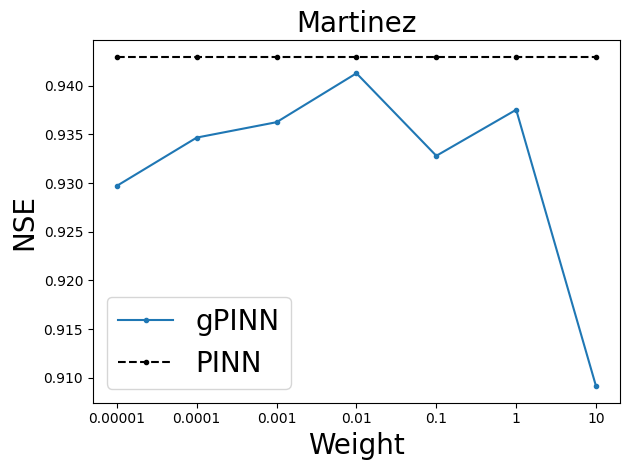

In [218]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

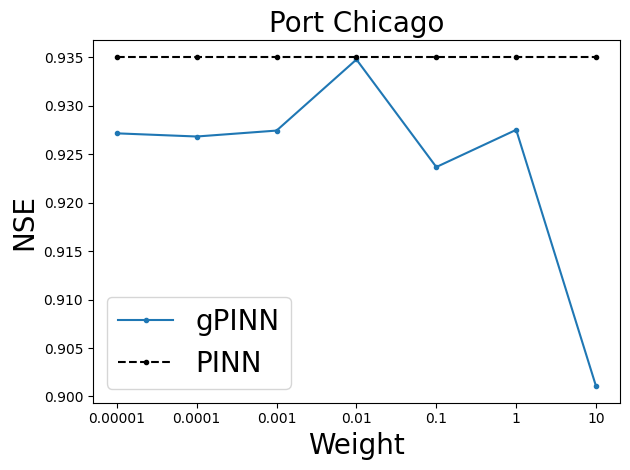

In [219]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][0][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

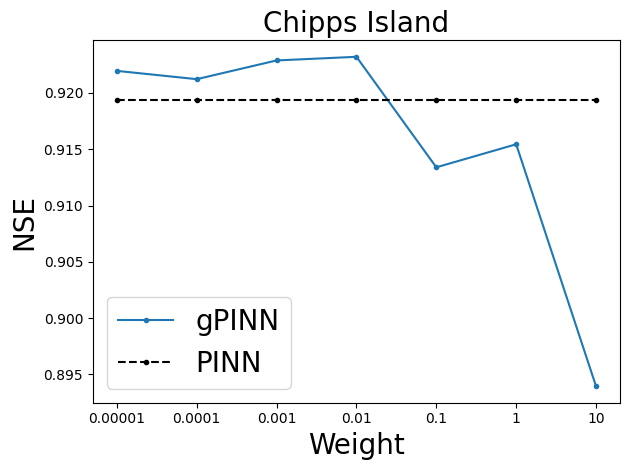

In [220]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

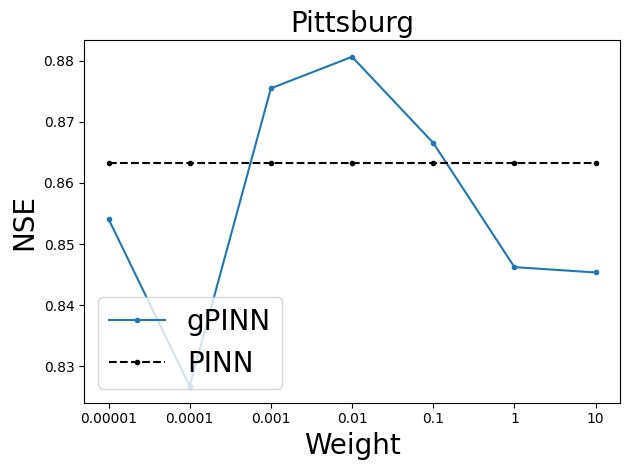

In [221]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### r^2

In [222]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'R'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS1[location][name][metric] ** 2)
    METRIC.append(temp)

METRIC = np.array(METRIC)

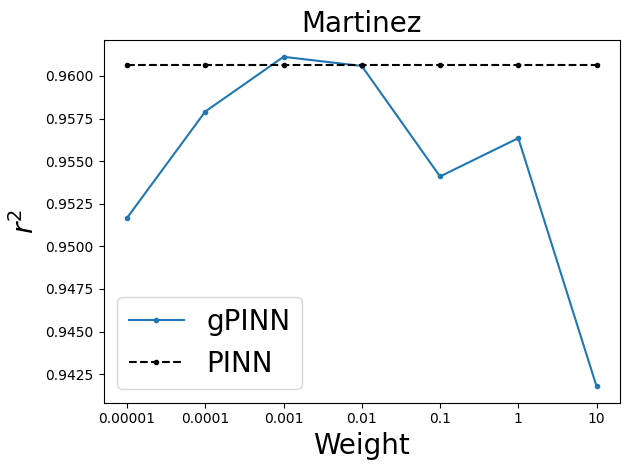

In [223]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

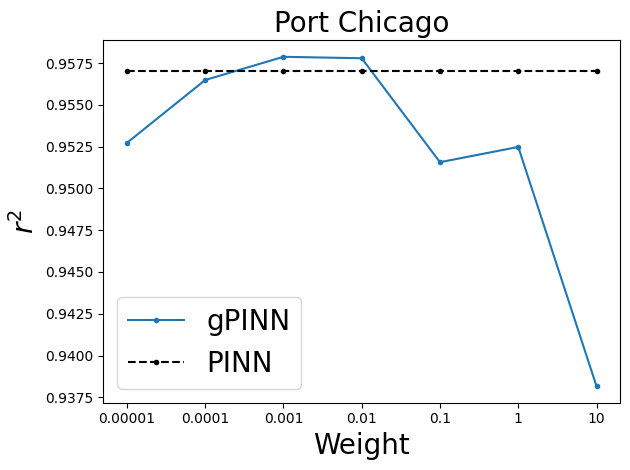

In [224]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][0][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

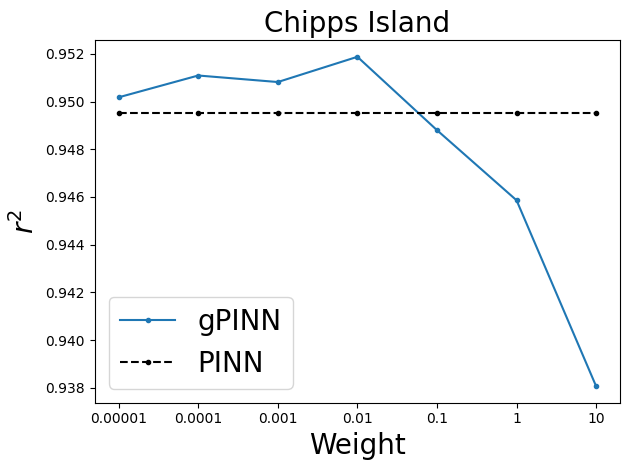

In [225]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

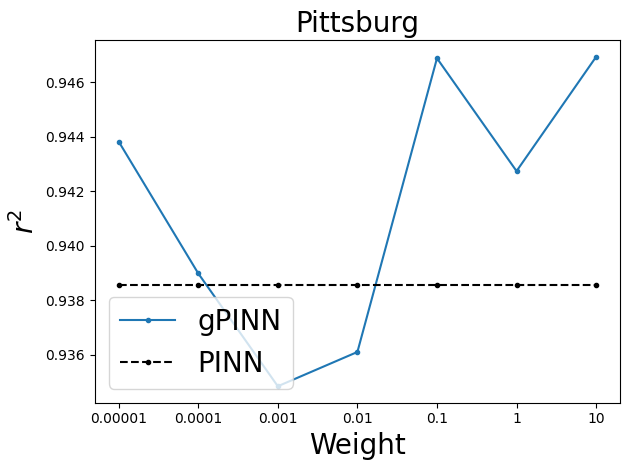

In [226]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### Bias

In [227]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'Bias'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS1[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

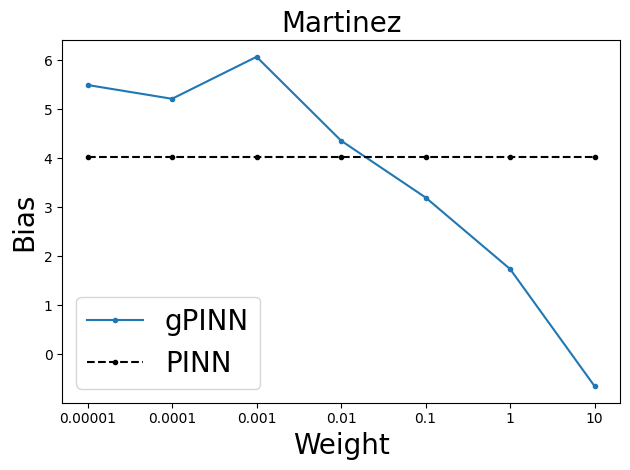

In [228]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

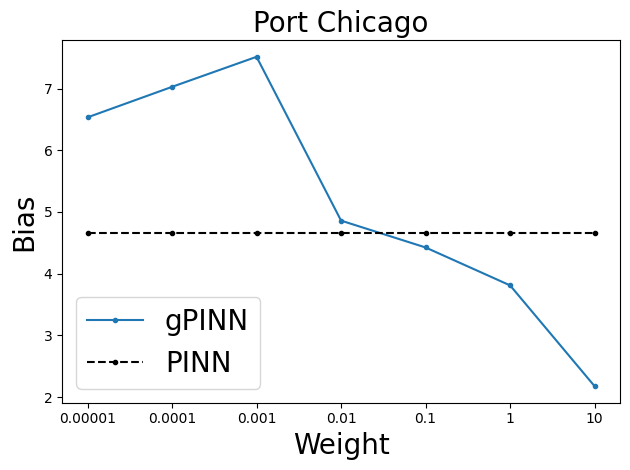

In [229]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][0][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

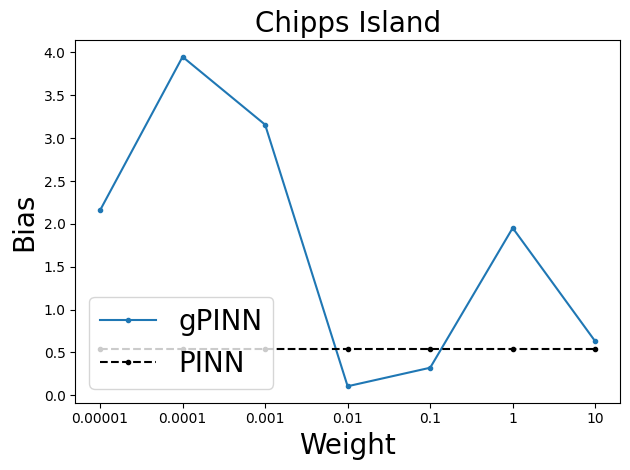

In [230]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

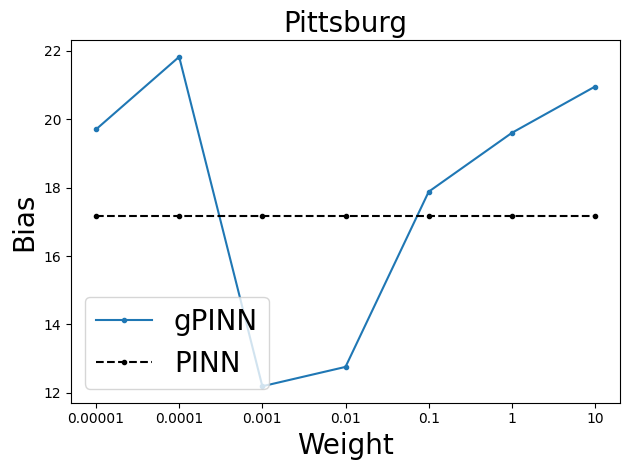

In [231]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][0][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

## Time series

In [90]:
def plotter(k, gPINN_RESULTS, PINN_RESULTS, xloc, yloc, tst_years, w):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    name_t = 'model' + str(w) + '_timeseries'
    name_r = 'model' + str(w) + '_results'

    gPINN_timeseries_M = gPINN_RESULTS['Martinez'][name_t]
    PINN_timeseries_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_timeseries']
    gPINN_results_M = gPINN_RESULTS['Martinez'][name_r]
    PINN_results_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_results']

    gPINN_timeseries_P = gPINN_RESULTS['Port Chicago'][name_t]
    PINN_timeseries_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_timeseries']
    gPINN_results_P = gPINN_RESULTS['Port Chicago'][name_r]
    PINN_results_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_results']

    gPINN_timeseries_C = gPINN_RESULTS['Chipps Island'][name_t]
    PINN_timeseries_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_timeseries']
    gPINN_results_C = gPINN_RESULTS['Chipps Island'][name_r]
    PINN_results_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_results']

    gPINN_timeseries_T = gPINN_RESULTS['Pittsburg'][name_t]
    PINN_timeseries_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_timeseries']
    gPINN_results_T = gPINN_RESULTS['Pittsburg'][name_r]
    PINN_results_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_M['R']**2, PINN_results_M['R']**2, gPINN_results_M['Bias'], PINN_results_M['Bias'], gPINN_results_M['RSR'], PINN_results_M['RSR'], gPINN_results_M['NSE'], PINN_results_M['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 1500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_P['R']**2, PINN_results_P['R']**2, gPINN_results_P['Bias'], PINN_results_P['Bias'], gPINN_results_P['RSR'], PINN_results_P['RSR'], gPINN_results_P['NSE'], PINN_results_P['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 3000, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_C['R']**2, PINN_results_C['R']**2, gPINN_results_C['Bias'], PINN_results_C['Bias'], gPINN_results_C['RSR'], PINN_results_C['RSR'], gPINN_results_C['NSE'], PINN_results_C['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Pittsburg
    fig4 = pl.figure(4, figsize=(24,6))
    pl.plot(tst_EC_d[:, 3] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 7500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_T['R']**2, PINN_results_T['R']**2, gPINN_results_T['Bias'], PINN_results_T['Bias'], gPINN_results_T['RSR'], PINN_results_T['RSR'], gPINN_results_T['NSE'], PINN_results_T['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Pittsburg (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3, fig4

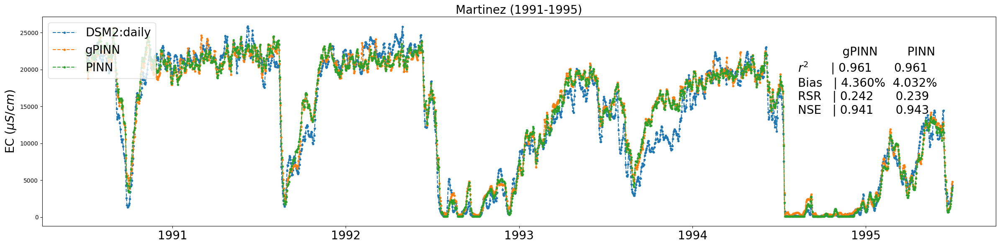

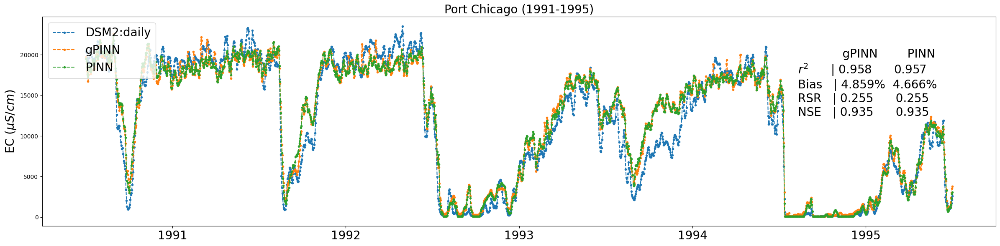

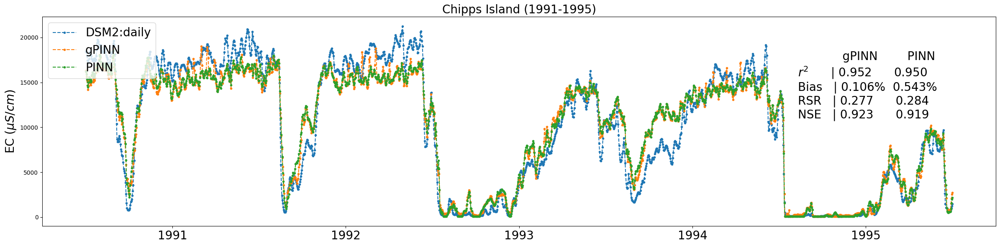

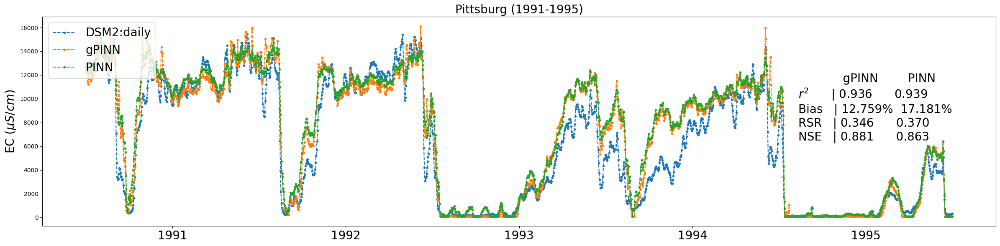

In [91]:
fig1, fig2, fig3, fig4 = plotter(1, tst_RESULTS1, ALL_RESULTS_TST, 1500, 14000, ['1991','1992','1993','1994','1995'], 2)

# Plots (Test: 1996-2000)

## Evaluation metrics

### NSE

In [232]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'NSE'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS2[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

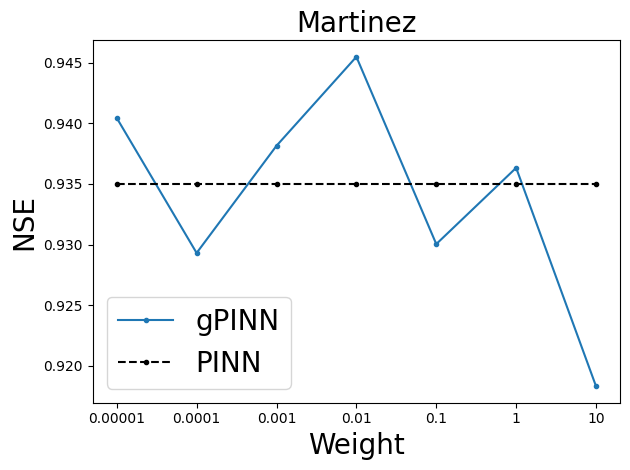

In [233]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

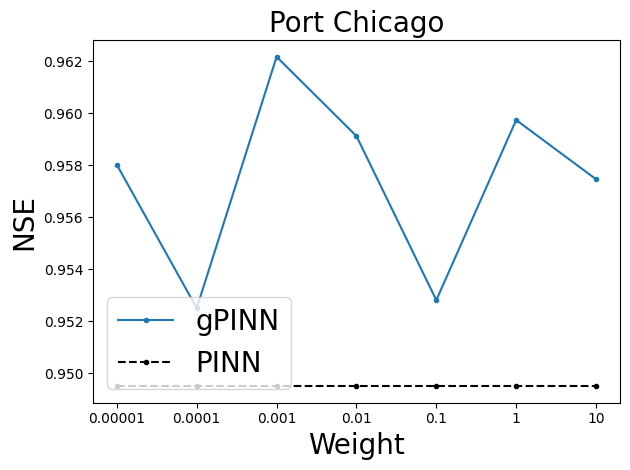

In [234]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][1][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

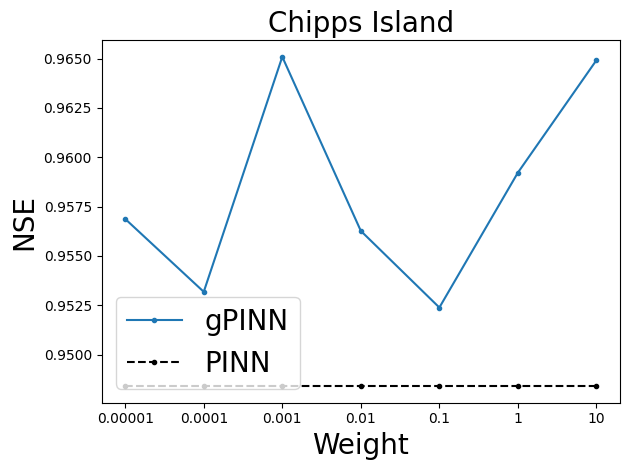

In [235]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

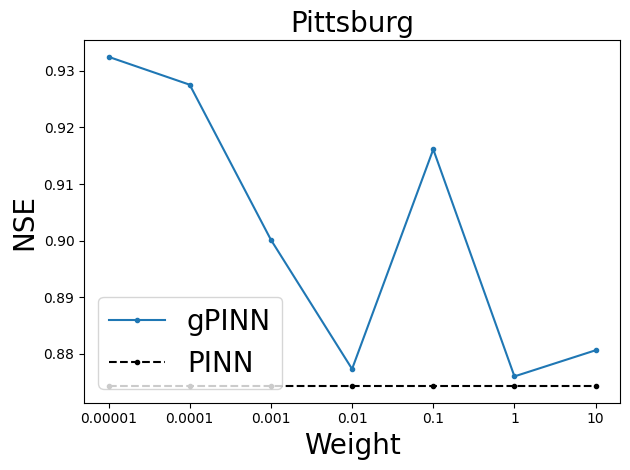

In [236]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### r^2

In [237]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'R'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS2[location][name][metric] ** 2)
    METRIC.append(temp)

METRIC = np.array(METRIC)

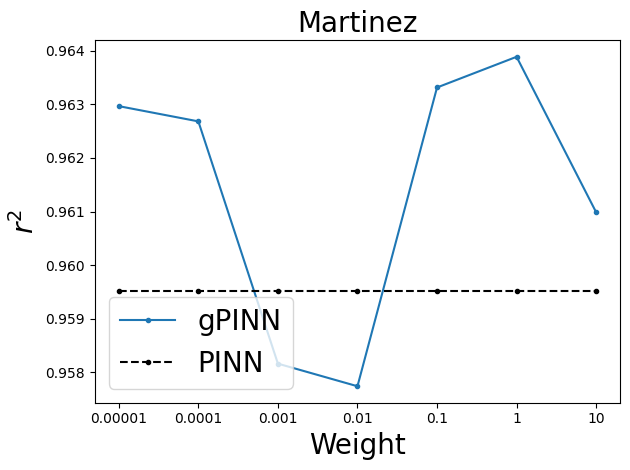

In [238]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

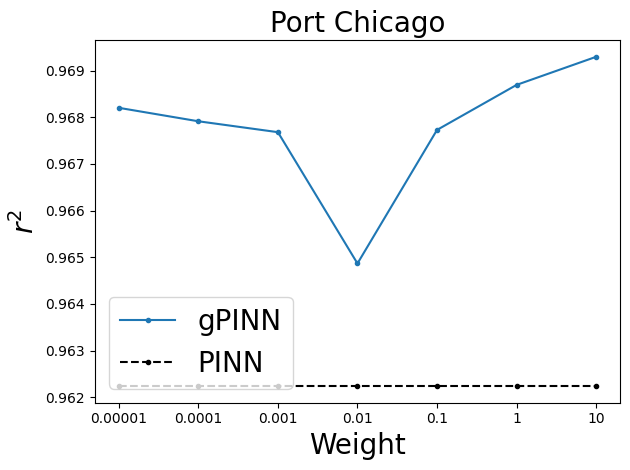

In [239]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][1][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

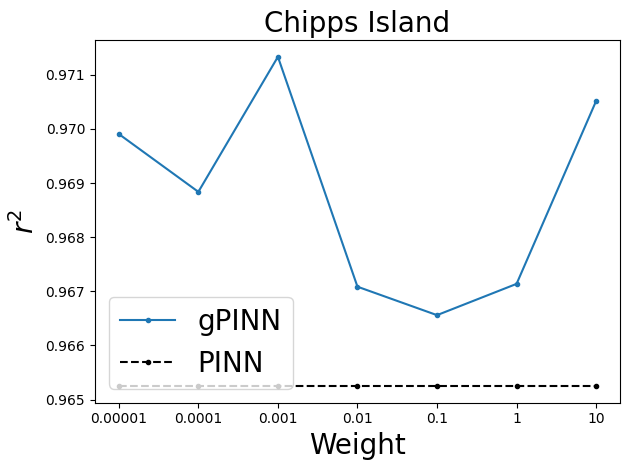

In [240]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

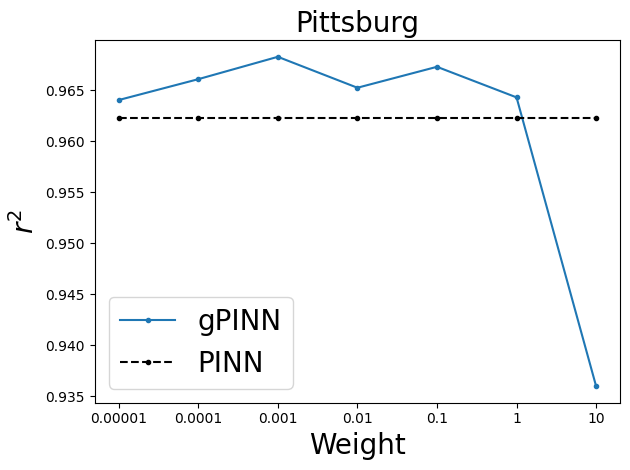

In [241]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### Bias

In [242]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'Bias'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS2[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

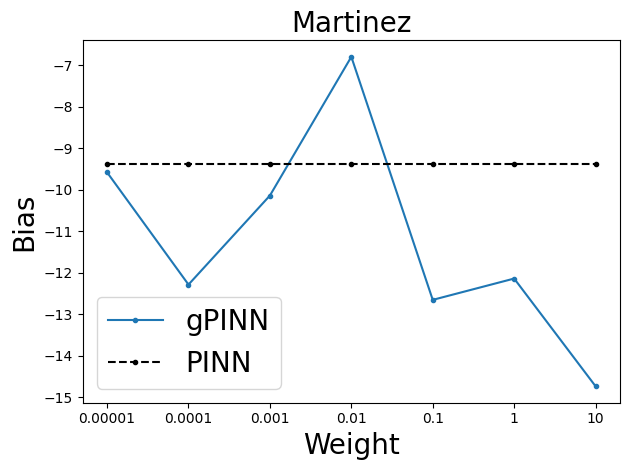

In [243]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

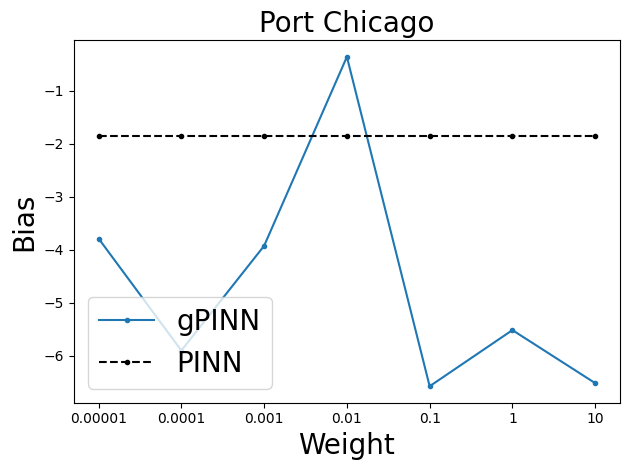

In [244]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][1][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

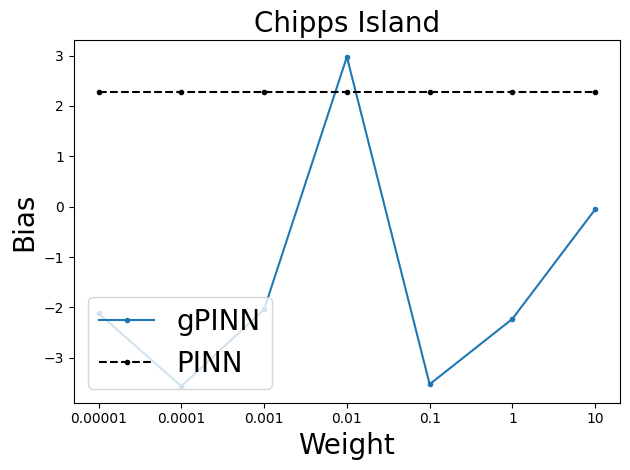

In [245]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

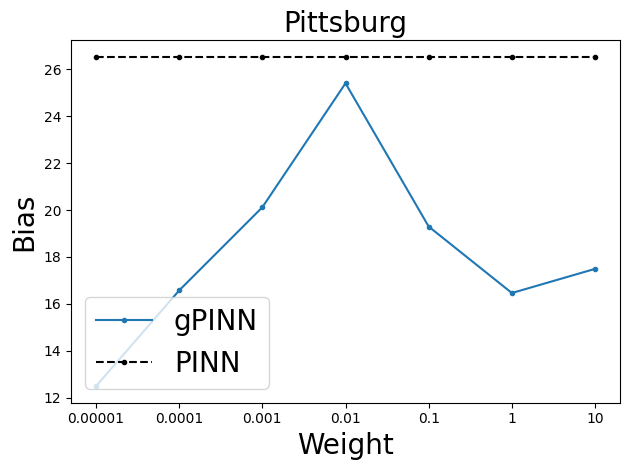

In [246]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][1][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

## Time series

In [107]:
def plotter(k, gPINN_RESULTS, PINN_RESULTS, xloc, yloc, tst_years, w):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    name_t = 'model' + str(w) + '_timeseries'
    name_r = 'model' + str(w) + '_results'

    gPINN_timeseries_M = gPINN_RESULTS['Martinez'][name_t]
    PINN_timeseries_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_timeseries']
    gPINN_results_M = gPINN_RESULTS['Martinez'][name_r]
    PINN_results_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_results']

    gPINN_timeseries_P = gPINN_RESULTS['Port Chicago'][name_t]
    PINN_timeseries_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_timeseries']
    gPINN_results_P = gPINN_RESULTS['Port Chicago'][name_r]
    PINN_results_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_results']

    gPINN_timeseries_C = gPINN_RESULTS['Chipps Island'][name_t]
    PINN_timeseries_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_timeseries']
    gPINN_results_C = gPINN_RESULTS['Chipps Island'][name_r]
    PINN_results_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_results']

    gPINN_timeseries_T = gPINN_RESULTS['Pittsburg'][name_t]
    PINN_timeseries_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_timeseries']
    gPINN_results_T = gPINN_RESULTS['Pittsburg'][name_r]
    PINN_results_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_M['R']**2, PINN_results_M['R']**2, gPINN_results_M['Bias'], PINN_results_M['Bias'], gPINN_results_M['RSR'], PINN_results_M['RSR'], gPINN_results_M['NSE'], PINN_results_M['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 1500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_P['R']**2, PINN_results_P['R']**2, gPINN_results_P['Bias'], PINN_results_P['Bias'], gPINN_results_P['RSR'], PINN_results_P['RSR'], gPINN_results_P['NSE'], PINN_results_P['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 3000, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_C['R']**2, PINN_results_C['R']**2, gPINN_results_C['Bias'], PINN_results_C['Bias'], gPINN_results_C['RSR'], PINN_results_C['RSR'], gPINN_results_C['NSE'], PINN_results_C['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Pittsburg
    fig4 = pl.figure(4, figsize=(24,6))
    pl.plot(tst_EC_d[:, 3] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 7500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_T['R']**2, PINN_results_T['R']**2, gPINN_results_T['Bias'], PINN_results_T['Bias'], gPINN_results_T['RSR'], PINN_results_T['RSR'], gPINN_results_T['NSE'], PINN_results_T['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Pittsburg (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3, fig4

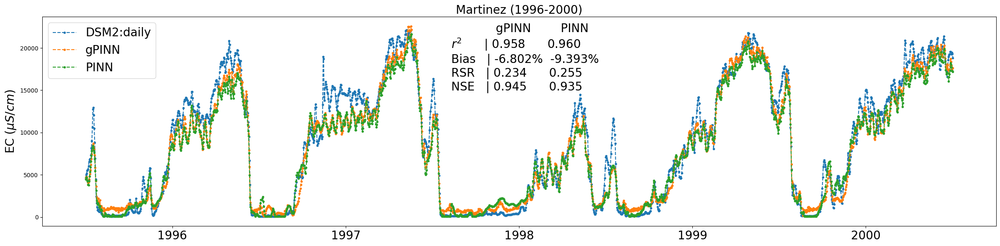

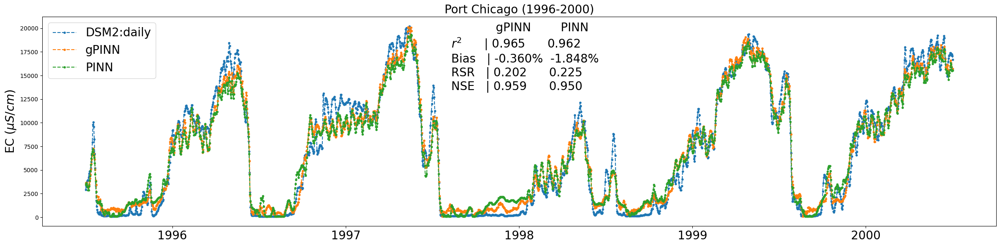

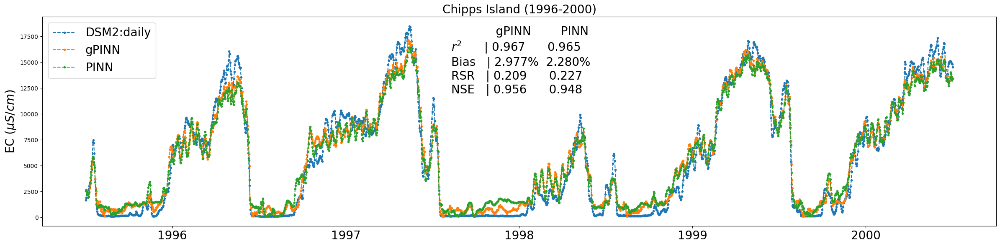

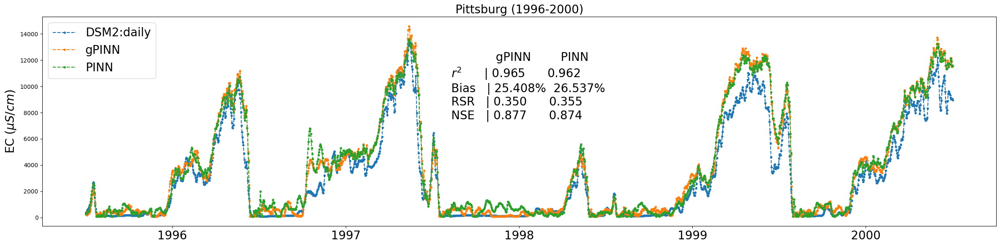

In [108]:
fig1, fig2, fig3, fig4 = plotter(2, tst_RESULTS2, ALL_RESULTS_TST, 770, 15000, ['1996','1997','1998','1999','2000'], 2)

# Plots (Test: 2001-2005)

## Evaluation metrics

### NSE

In [247]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'NSE'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS3[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

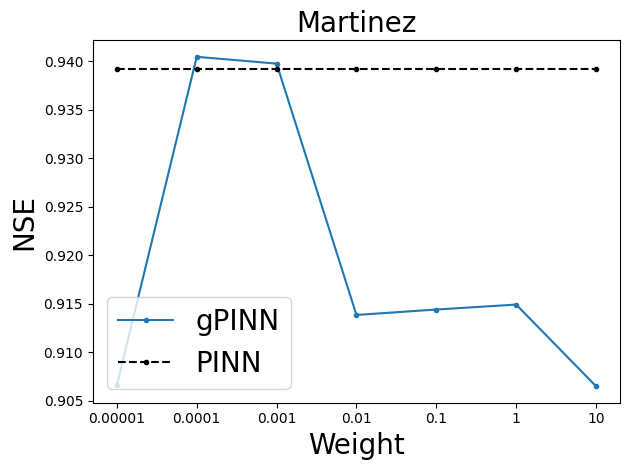

In [248]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

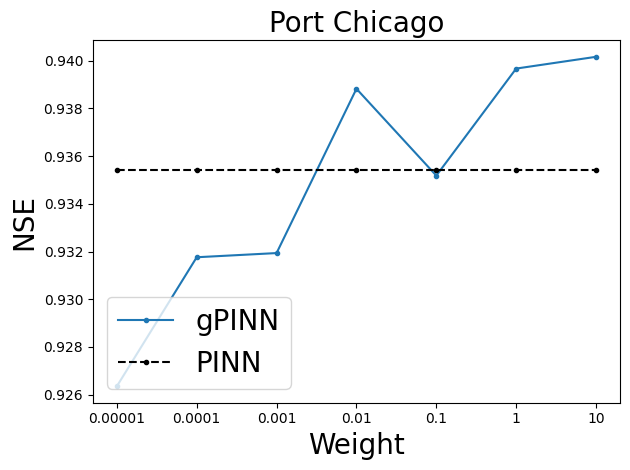

In [249]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][2][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

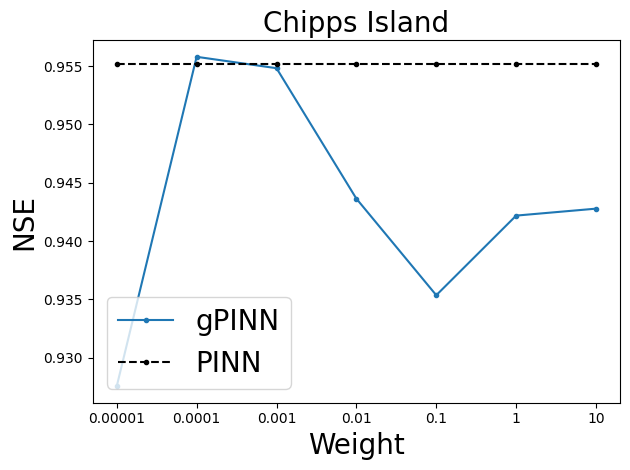

In [250]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

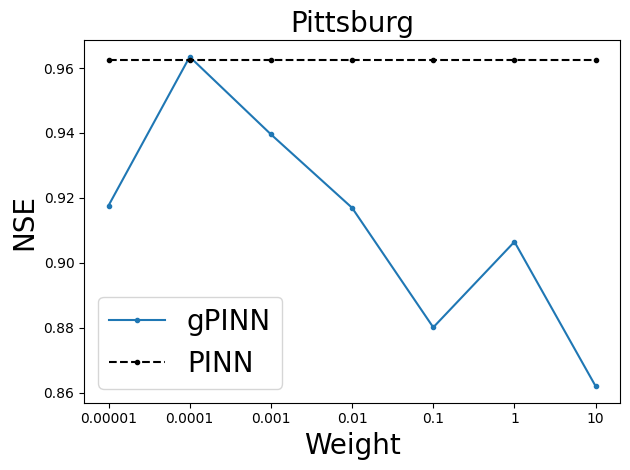

In [251]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### r^2

In [252]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'R'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS3[location][name][metric] ** 2)
    METRIC.append(temp)

METRIC = np.array(METRIC)

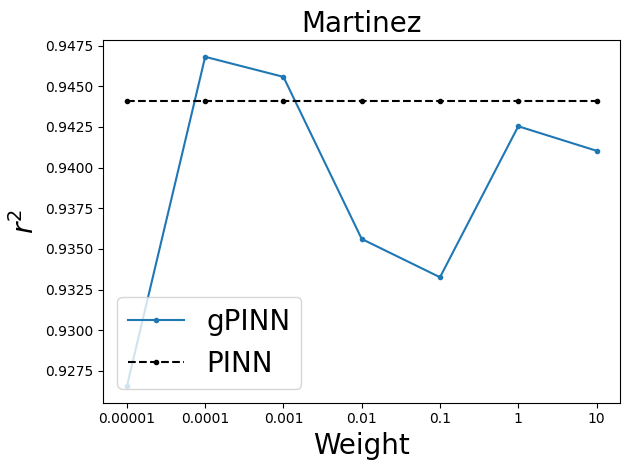

In [253]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

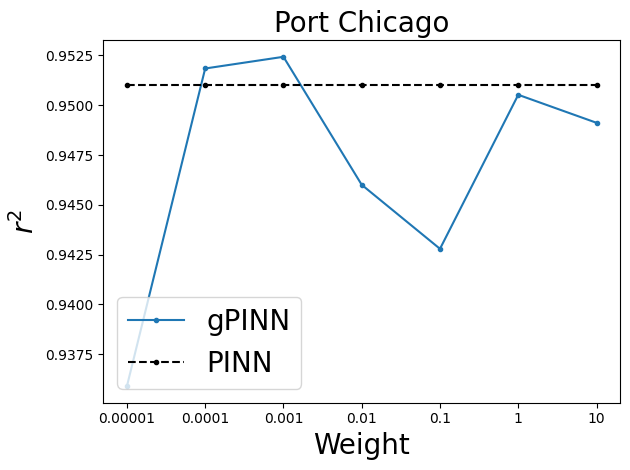

In [254]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][2][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

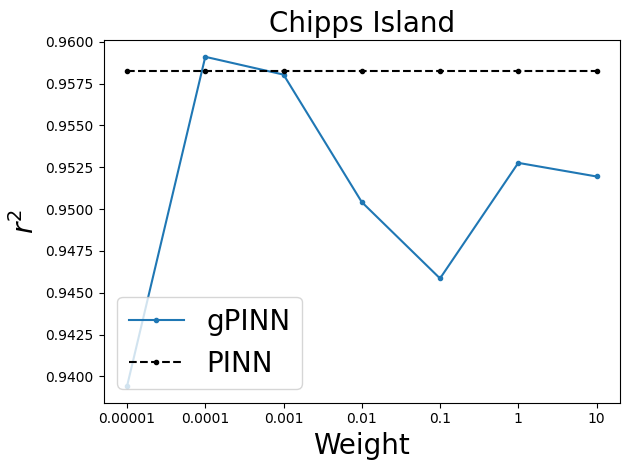

In [255]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

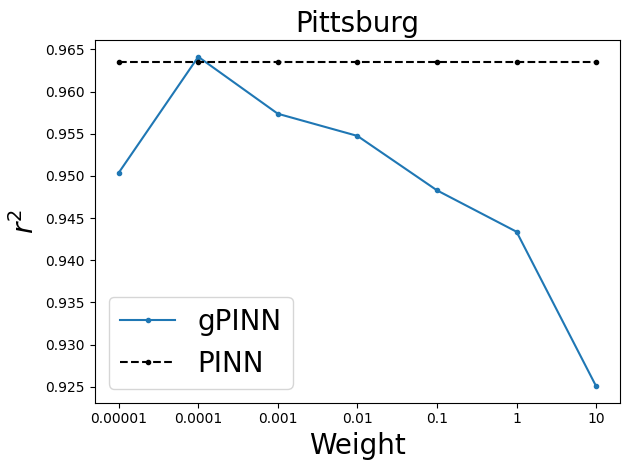

In [256]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### Bias

In [257]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'Bias'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS3[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

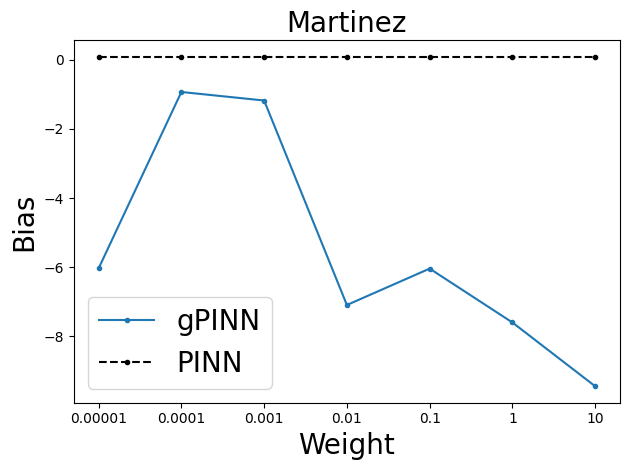

In [258]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

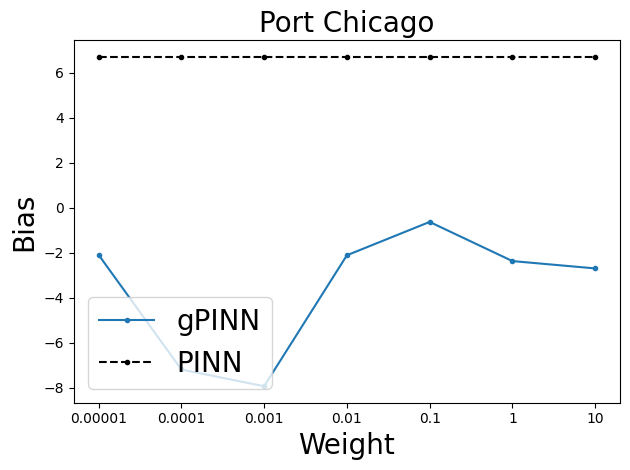

In [259]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][2][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

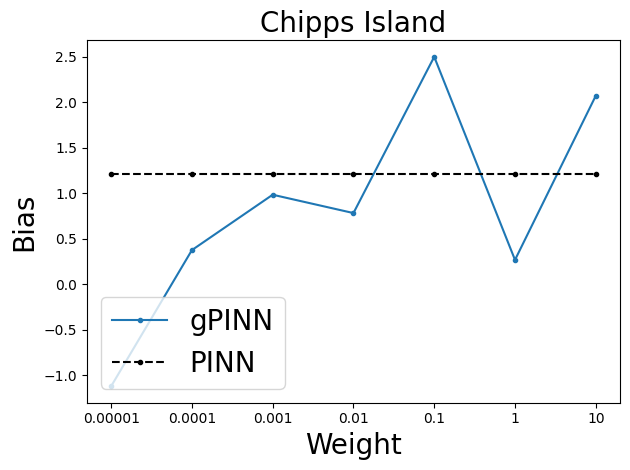

In [260]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

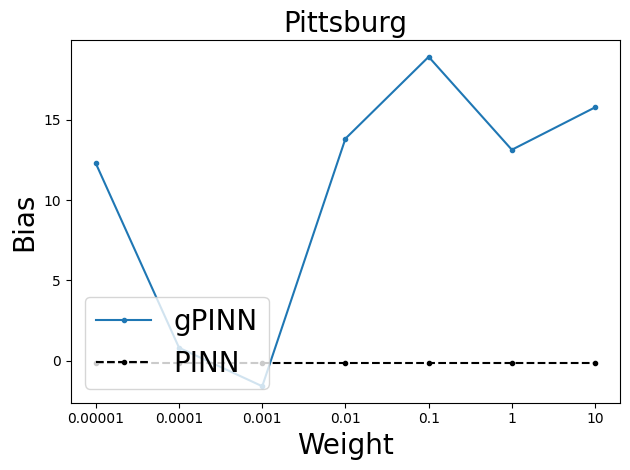

In [261]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][2][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

## Time series

In [124]:
def plotter(k, gPINN_RESULTS, PINN_RESULTS, xloc, yloc, tst_years, w):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    name_t = 'model' + str(w) + '_timeseries'
    name_r = 'model' + str(w) + '_results'

    gPINN_timeseries_M = gPINN_RESULTS['Martinez'][name_t]
    PINN_timeseries_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_timeseries']
    gPINN_results_M = gPINN_RESULTS['Martinez'][name_r]
    PINN_results_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_results']

    gPINN_timeseries_P = gPINN_RESULTS['Port Chicago'][name_t]
    PINN_timeseries_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_timeseries']
    gPINN_results_P = gPINN_RESULTS['Port Chicago'][name_r]
    PINN_results_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_results']

    gPINN_timeseries_C = gPINN_RESULTS['Chipps Island'][name_t]
    PINN_timeseries_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_timeseries']
    gPINN_results_C = gPINN_RESULTS['Chipps Island'][name_r]
    PINN_results_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_results']

    gPINN_timeseries_T = gPINN_RESULTS['Pittsburg'][name_t]
    PINN_timeseries_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_timeseries']
    gPINN_results_T = gPINN_RESULTS['Pittsburg'][name_r]
    PINN_results_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_M['R']**2, PINN_results_M['R']**2, gPINN_results_M['Bias'], PINN_results_M['Bias'], gPINN_results_M['RSR'], PINN_results_M['RSR'], gPINN_results_M['NSE'], PINN_results_M['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 1500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_P['R']**2, PINN_results_P['R']**2, gPINN_results_P['Bias'], PINN_results_P['Bias'], gPINN_results_P['RSR'], PINN_results_P['RSR'], gPINN_results_P['NSE'], PINN_results_P['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 3000, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_C['R']**2, PINN_results_C['R']**2, gPINN_results_C['Bias'], PINN_results_C['Bias'], gPINN_results_C['RSR'], PINN_results_C['RSR'], gPINN_results_C['NSE'], PINN_results_C['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Pittsburg
    fig4 = pl.figure(4, figsize=(24,6))
    pl.plot(tst_EC_d[:, 3] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 7500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_T['R']**2, PINN_results_T['R']**2, gPINN_results_T['Bias'], PINN_results_T['Bias'], gPINN_results_T['RSR'], PINN_results_T['RSR'], gPINN_results_T['NSE'], PINN_results_T['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Pittsburg (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3, fig4

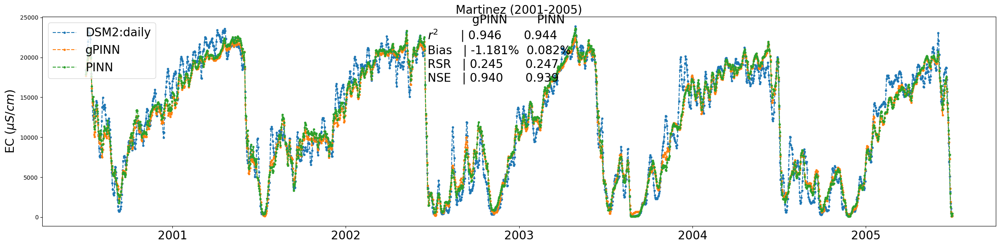

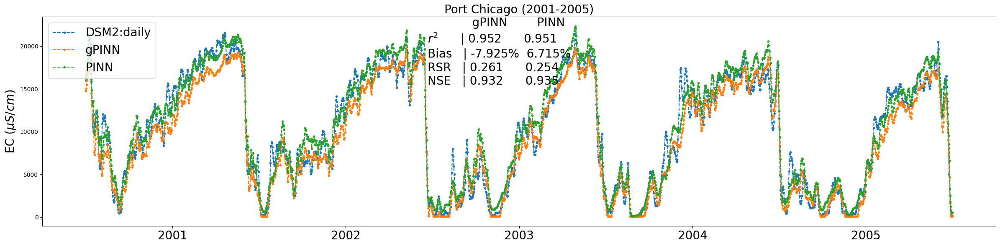

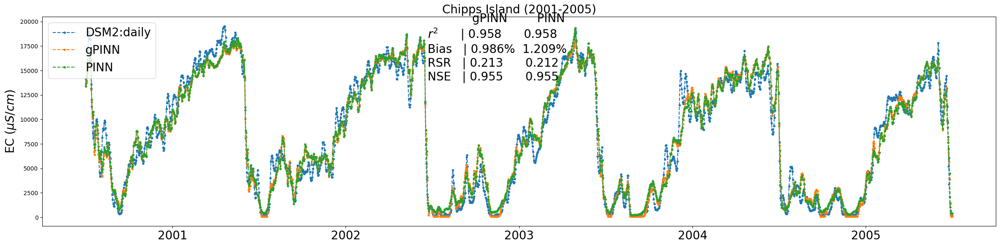

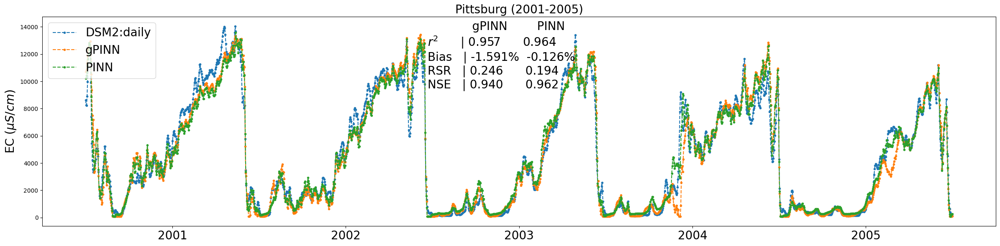

In [125]:
fig1, fig2, fig3, fig4 = plotter(3, tst_RESULTS3, ALL_RESULTS_TST, 720, 17000, ['2001','2002','2003','2004','2005'], 1)

# Plots (Test: 2006-2010)

## Evaluation metrics

### NSE

In [262]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'NSE'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS4[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

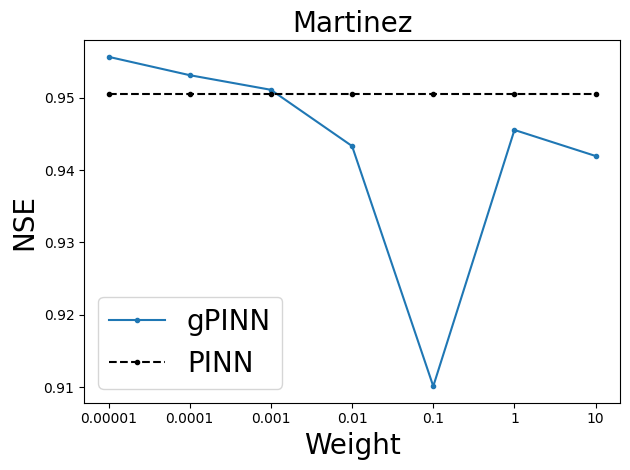

In [263]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

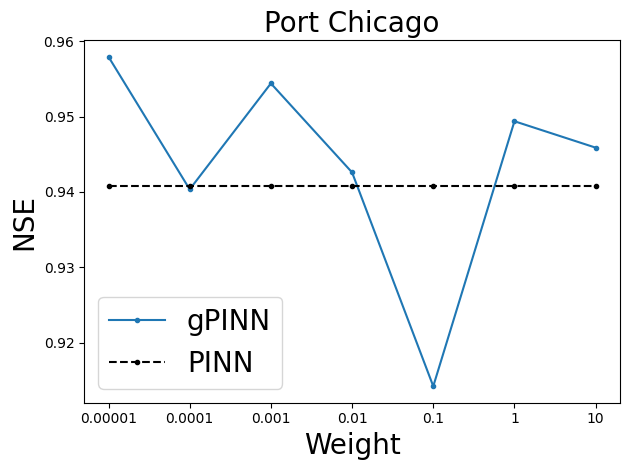

In [264]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][3][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

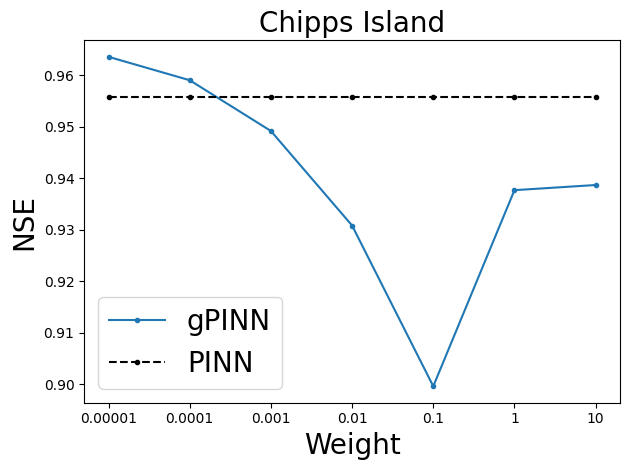

In [265]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

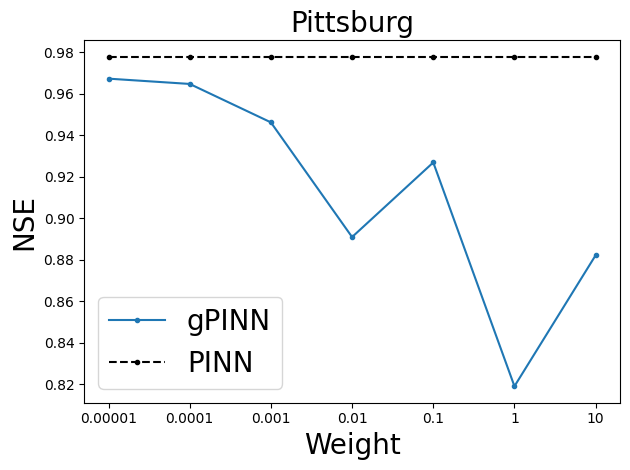

In [266]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### r^2

In [267]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'R'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS4[location][name][metric] ** 2)
    METRIC.append(temp)

METRIC = np.array(METRIC)

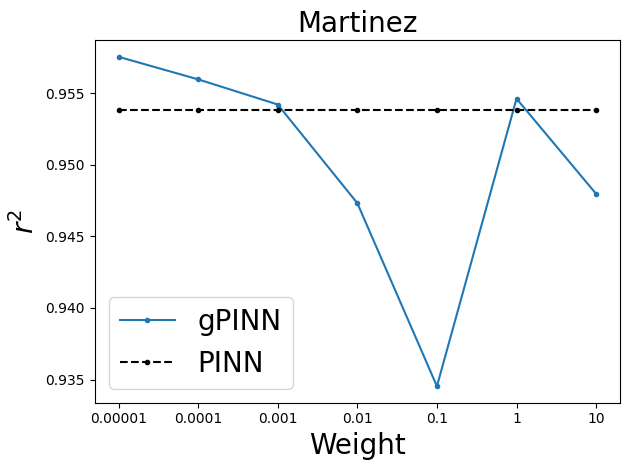

In [268]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

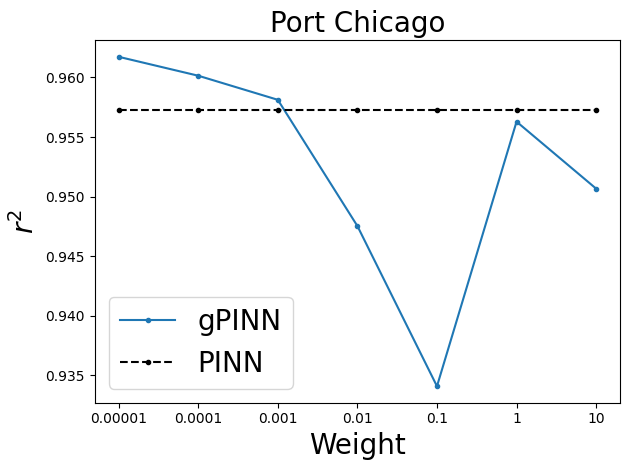

In [269]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][3][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

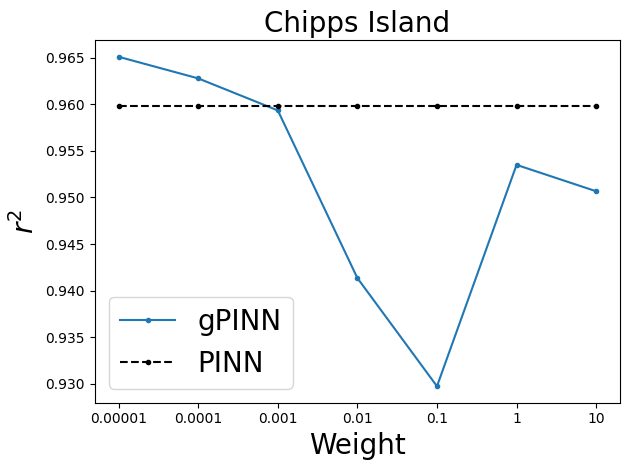

In [270]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

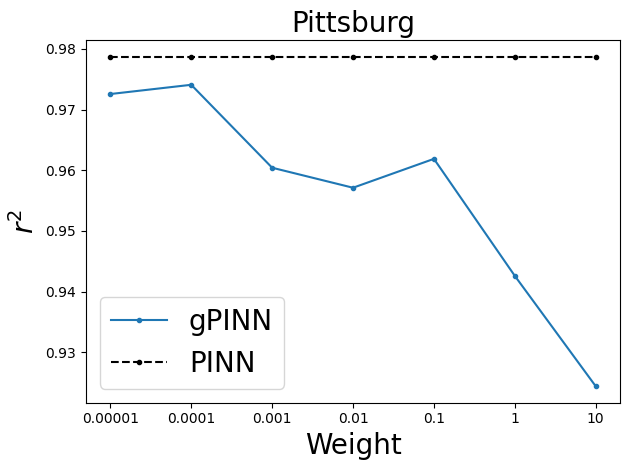

In [271]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### Bias

In [272]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'Bias'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS4[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

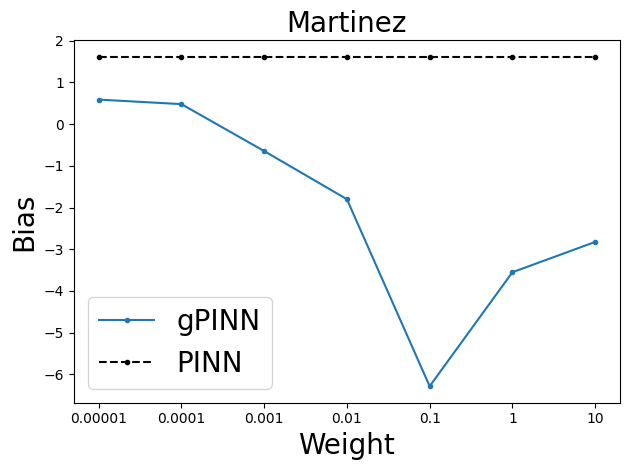

In [273]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

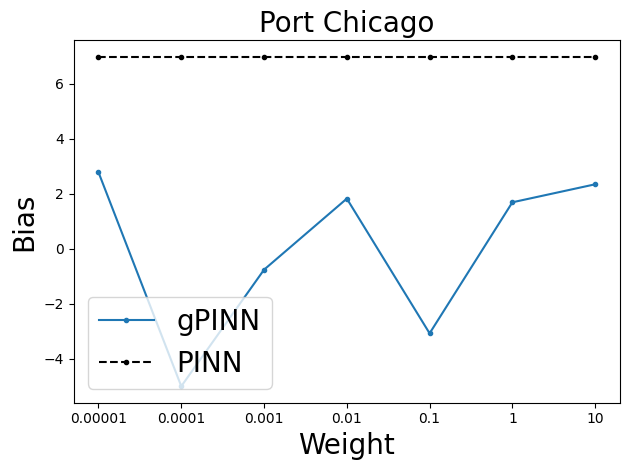

In [274]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][3][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

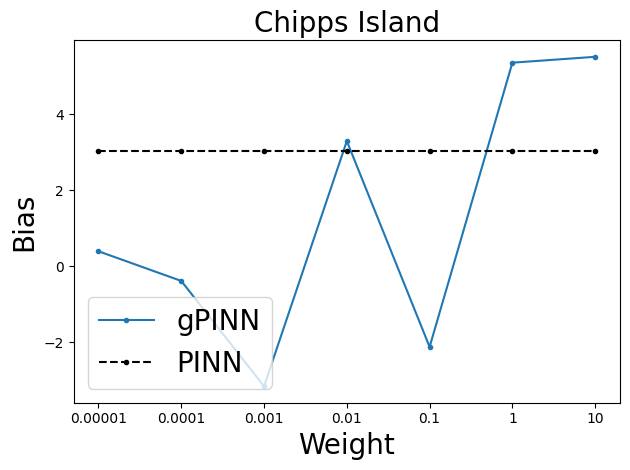

In [275]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

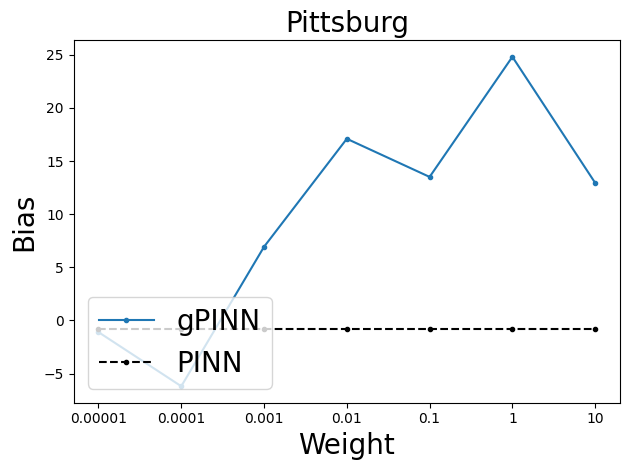

In [276]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][3][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

## Time series

In [142]:
def plotter(k, gPINN_RESULTS, PINN_RESULTS, xloc, yloc, tst_years, w):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    name_t = 'model' + str(w) + '_timeseries'
    name_r = 'model' + str(w) + '_results'

    gPINN_timeseries_M = gPINN_RESULTS['Martinez'][name_t]
    PINN_timeseries_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_timeseries']
    gPINN_results_M = gPINN_RESULTS['Martinez'][name_r]
    PINN_results_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_results']

    gPINN_timeseries_P = gPINN_RESULTS['Port Chicago'][name_t]
    PINN_timeseries_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_timeseries']
    gPINN_results_P = gPINN_RESULTS['Port Chicago'][name_r]
    PINN_results_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_results']

    gPINN_timeseries_C = gPINN_RESULTS['Chipps Island'][name_t]
    PINN_timeseries_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_timeseries']
    gPINN_results_C = gPINN_RESULTS['Chipps Island'][name_r]
    PINN_results_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_results']

    gPINN_timeseries_T = gPINN_RESULTS['Pittsburg'][name_t]
    PINN_timeseries_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_timeseries']
    gPINN_results_T = gPINN_RESULTS['Pittsburg'][name_r]
    PINN_results_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_M['R']**2, PINN_results_M['R']**2, gPINN_results_M['Bias'], PINN_results_M['Bias'], gPINN_results_M['RSR'], PINN_results_M['RSR'], gPINN_results_M['NSE'], PINN_results_M['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 1500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_P['R']**2, PINN_results_P['R']**2, gPINN_results_P['Bias'], PINN_results_P['Bias'], gPINN_results_P['RSR'], PINN_results_P['RSR'], gPINN_results_P['NSE'], PINN_results_P['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 3000, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_C['R']**2, PINN_results_C['R']**2, gPINN_results_C['Bias'], PINN_results_C['Bias'], gPINN_results_C['RSR'], PINN_results_C['RSR'], gPINN_results_C['NSE'], PINN_results_C['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Pittsburg
    fig4 = pl.figure(4, figsize=(24,6))
    pl.plot(tst_EC_d[:, 3] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 7500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_T['R']**2, PINN_results_T['R']**2, gPINN_results_T['Bias'], PINN_results_T['Bias'], gPINN_results_T['RSR'], PINN_results_T['RSR'], gPINN_results_T['NSE'], PINN_results_T['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Pittsburg (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3, fig4

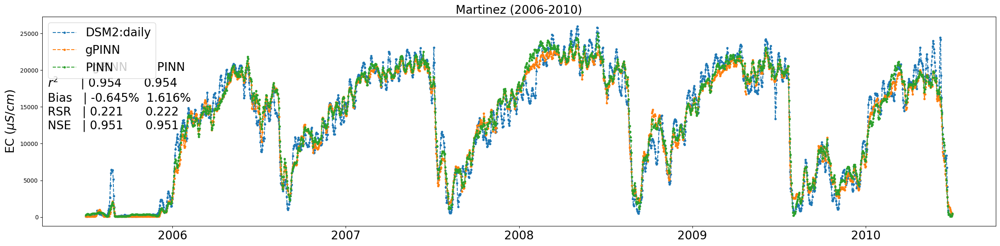

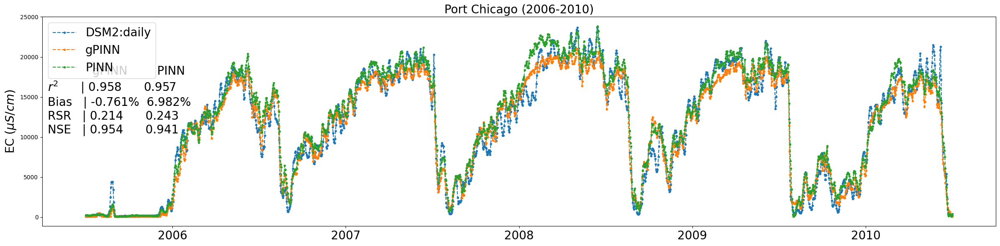

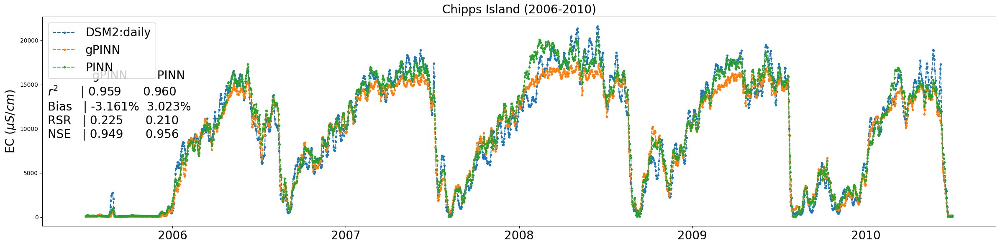

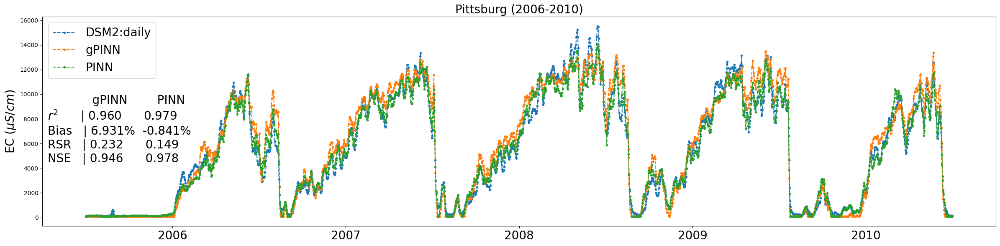

In [143]:
fig1, fig2, fig3, fig4 = plotter(4, tst_RESULTS4, ALL_RESULTS_TST, -80, 12000, ['2006','2007','2008','2009','2010'], 1)

# Plots (Test: 2011-2015)

## Evaluation metrics

### NSE

In [277]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'NSE'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS5[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

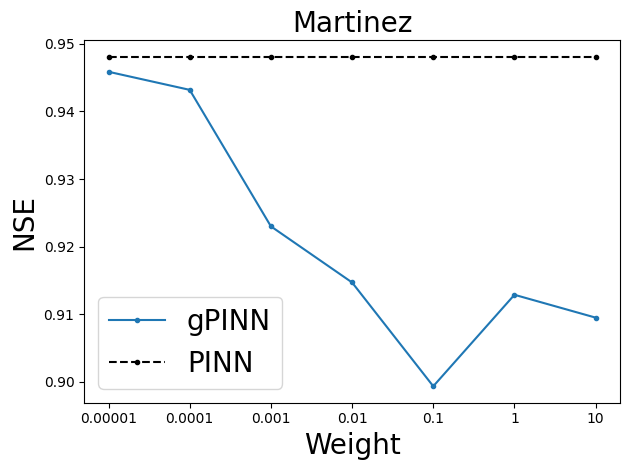

In [278]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

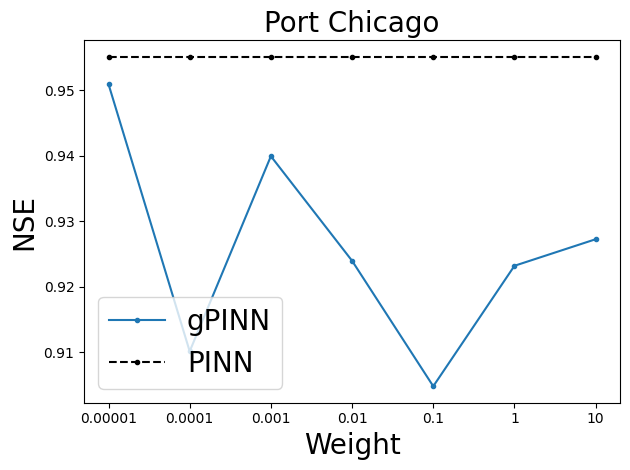

In [279]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][4][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

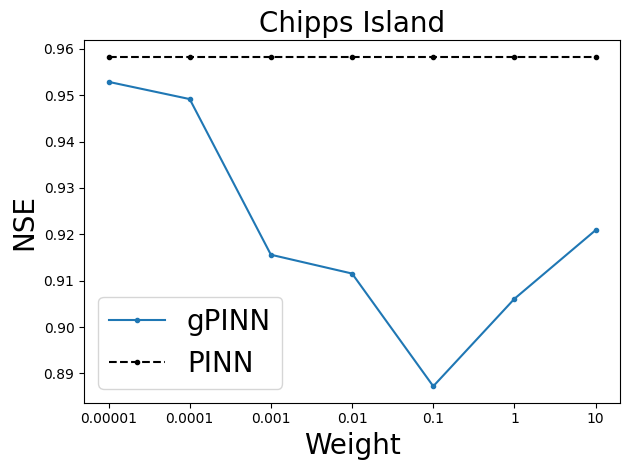

In [280]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

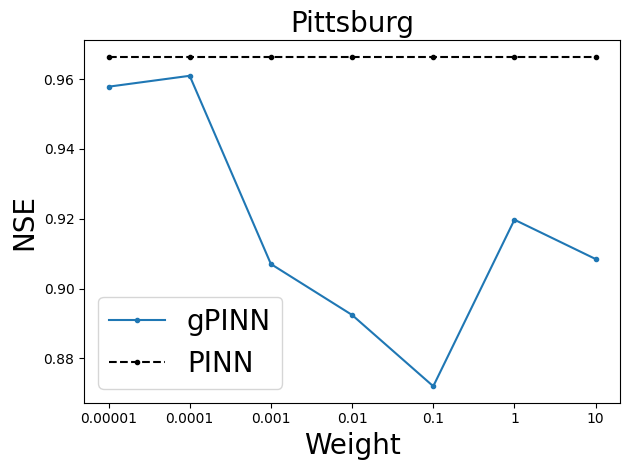

In [281]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results']['NSE']] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('NSE', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### r^2

In [282]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'R'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS5[location][name][metric] ** 2)
    METRIC.append(temp)

METRIC = np.array(METRIC)

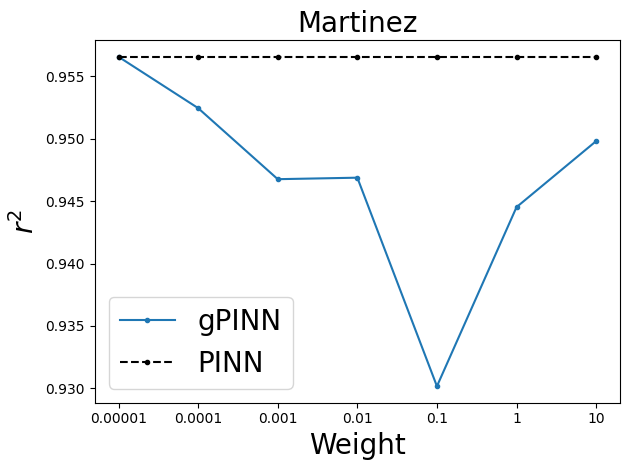

In [283]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

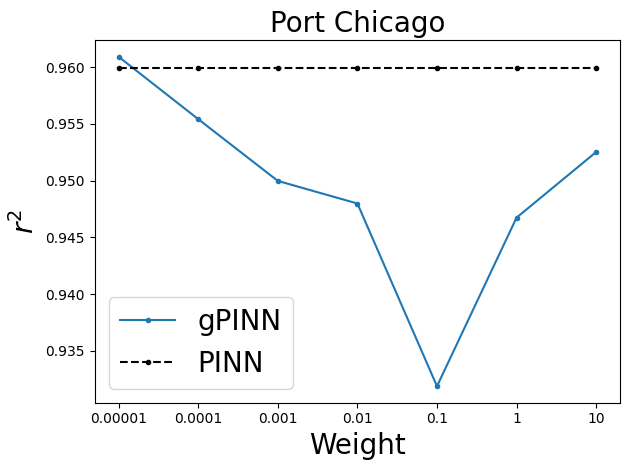

In [284]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][4][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

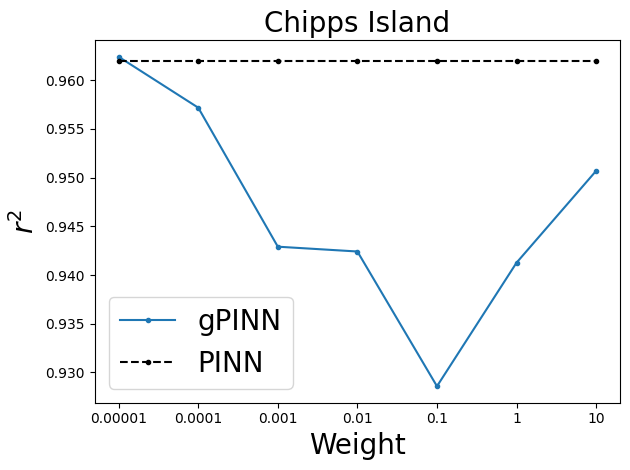

In [285]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

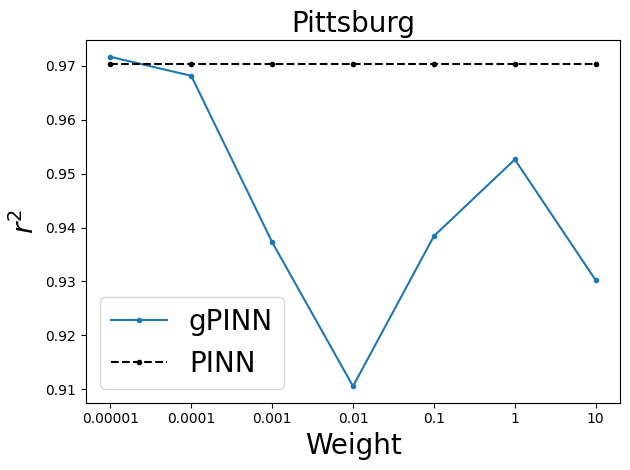

In [286]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric] ** 2] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel('$r^2$', fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

### Bias

In [287]:
METRIC = []
LOCATION = ['Martinez', 'Port Chicago', 'Chipps Island', 'Pittsburg']
metric = 'Bias'

for location in LOCATION:
    temp = []
    for j in range(7):
        name = 'model' + str(j + 1) + '_results'
        temp.append(tst_RESULTS5[location][name][metric])
    METRIC.append(temp)

METRIC = np.array(METRIC)

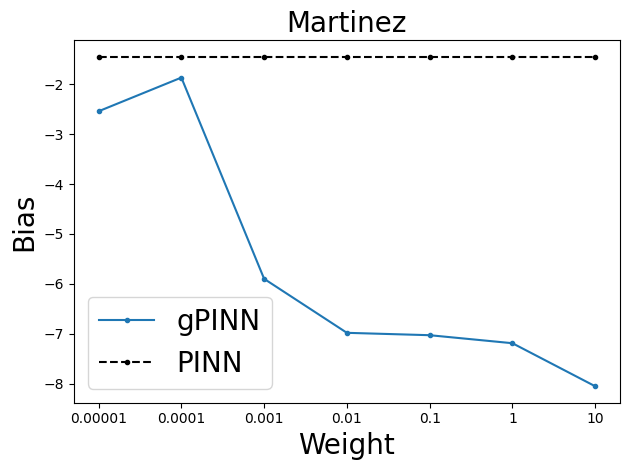

In [288]:
location = 'Martinez'
pl.plot(METRIC[0, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

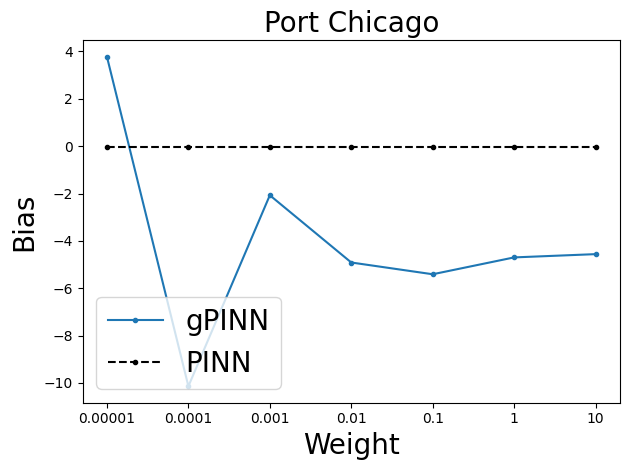

In [289]:
location = 'Port Chicago'
pl.plot(METRIC[1, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['PORT'][4][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

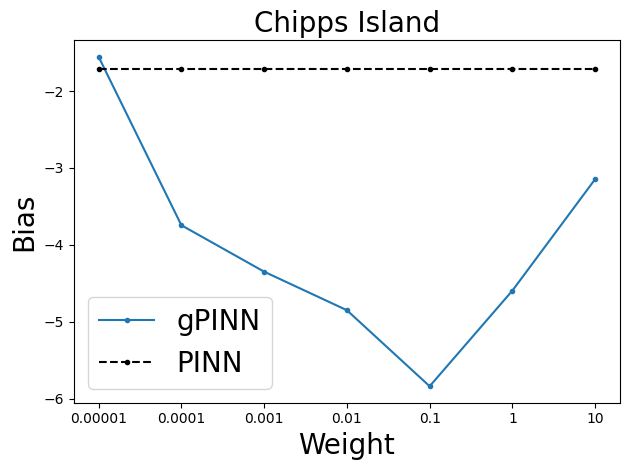

In [290]:
location = 'Chipps Island'
pl.plot(METRIC[2, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

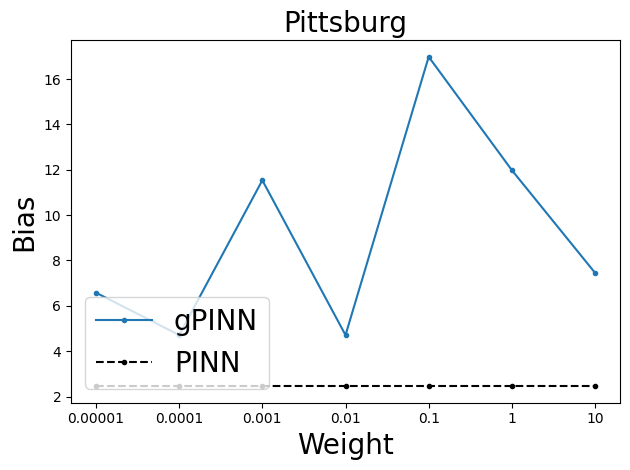

In [291]:
location = 'Pittsburg'
pl.plot(METRIC[3, :], '.-', label='gPINN')
pl.plot([ALL_RESULTS_TST['RES'][4][location]['PINN_results'][metric]] * 7, 'k.--', label='PINN')
pl.legend(loc='lower left', fontsize=20)
pl.xticks([0, 1, 2, 3, 4, 5, 6], ['0.00001', '0.0001', '0.001', '0.01', '0.1', '1', '10'], fontsize=10)
pl.ylabel(metric, fontsize=20)
pl.xlabel('Weight', fontsize=20)
pl.title(location, fontsize=20)
pl.tight_layout()

## Time series

In [159]:
def plotter(k, gPINN_RESULTS, PINN_RESULTS, xloc, yloc, tst_years, w):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    name_t = 'model' + str(w) + '_timeseries'
    name_r = 'model' + str(w) + '_results'

    gPINN_timeseries_M = gPINN_RESULTS['Martinez'][name_t]
    PINN_timeseries_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_timeseries']
    gPINN_results_M = gPINN_RESULTS['Martinez'][name_r]
    PINN_results_M = PINN_RESULTS['RES'][k-1]['Martinez']['PINN_results']

    gPINN_timeseries_P = gPINN_RESULTS['Port Chicago'][name_t]
    PINN_timeseries_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_timeseries']
    gPINN_results_P = gPINN_RESULTS['Port Chicago'][name_r]
    PINN_results_P = PINN_RESULTS['PORT'][k-1]['Port Chicago']['PINN_results']

    gPINN_timeseries_C = gPINN_RESULTS['Chipps Island'][name_t]
    PINN_timeseries_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_timeseries']
    gPINN_results_C = gPINN_RESULTS['Chipps Island'][name_r]
    PINN_results_C = PINN_RESULTS['RES'][k-1]['Chipps Island']['PINN_results']

    gPINN_timeseries_T = gPINN_RESULTS['Pittsburg'][name_t]
    PINN_timeseries_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_timeseries']
    gPINN_results_T = gPINN_RESULTS['Pittsburg'][name_r]
    PINN_results_T = PINN_RESULTS['RES'][k-1]['Pittsburg']['PINN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_M['R']**2, PINN_results_M['R']**2, gPINN_results_M['Bias'], PINN_results_M['Bias'], gPINN_results_M['RSR'], PINN_results_M['RSR'], gPINN_results_M['NSE'], PINN_results_M['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 1500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_P['R']**2, PINN_results_P['R']**2, gPINN_results_P['Bias'], PINN_results_P['Bias'], gPINN_results_P['RSR'], PINN_results_P['RSR'], gPINN_results_P['NSE'], PINN_results_P['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 3000, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_C['R']**2, PINN_results_C['R']**2, gPINN_results_C['Bias'], PINN_results_C['Bias'], gPINN_results_C['RSR'], PINN_results_C['RSR'], gPINN_results_C['NSE'], PINN_results_C['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Pittsburg
    fig4 = pl.figure(4, figsize=(24,6))
    pl.plot(tst_EC_d[:, 3] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(gPINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='gPINN')
    pl.plot(PINN_timeseries_T * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.text(xloc, yloc - 7500, '            gPINN        PINN\n$r^2$      | %.3f      %.3f\nBias   | %.3f%%  %.3f%%\nRSR   | %.3f      %.3f\nNSE   | %.3f      %.3f' % (gPINN_results_T['R']**2, PINN_results_T['R']**2, gPINN_results_T['Bias'], PINN_results_T['Bias'], gPINN_results_T['RSR'], PINN_results_T['RSR'], gPINN_results_T['NSE'], PINN_results_T['NSE']), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC $(\mu S/cm)$', fontsize=20)
    pl.title('Pittsburg (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3, fig4

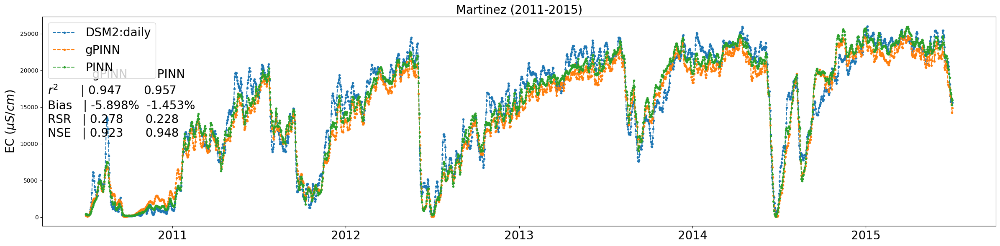

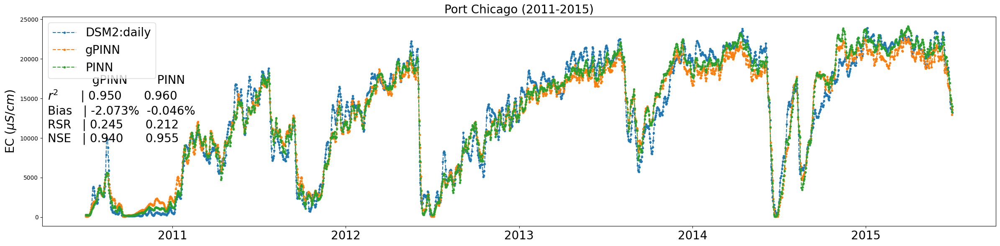

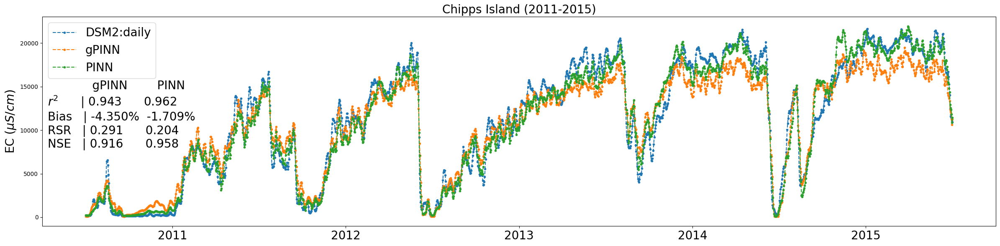

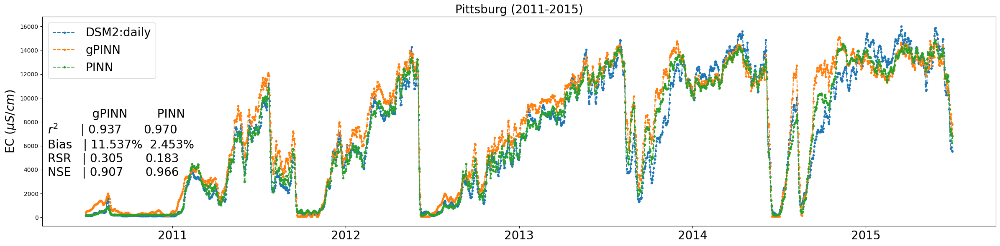

In [160]:
fig1, fig2, fig3, fig4 = plotter(5, tst_RESULTS5, ALL_RESULTS_TST, -80, 11000, ['2011','2012','2013','2014','2015'], 1)